In [2]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize
from scipy.stats import rankdata, entropy
import matplotlib.pyplot as plt
import seaborn as sns
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional
import warnings

Loading data...

--- Processing Season 1 ---


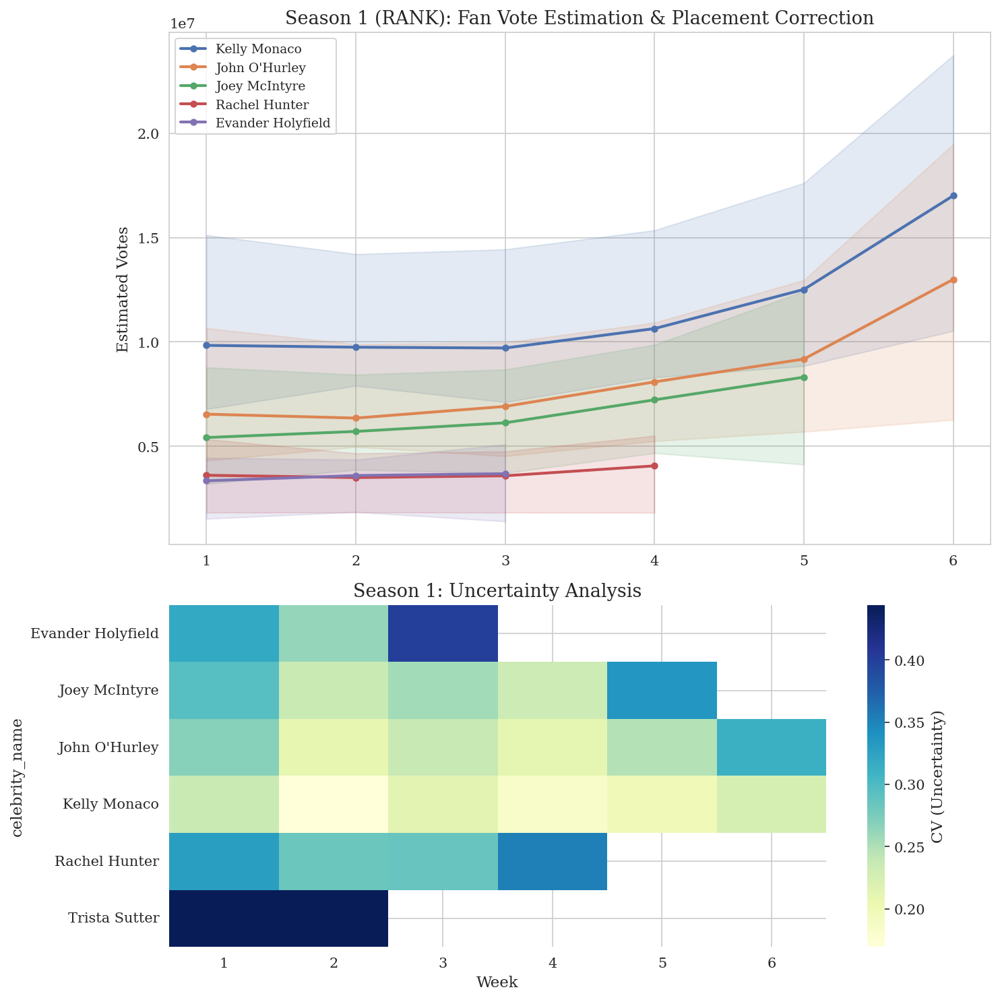


--- Processing Season 2 ---


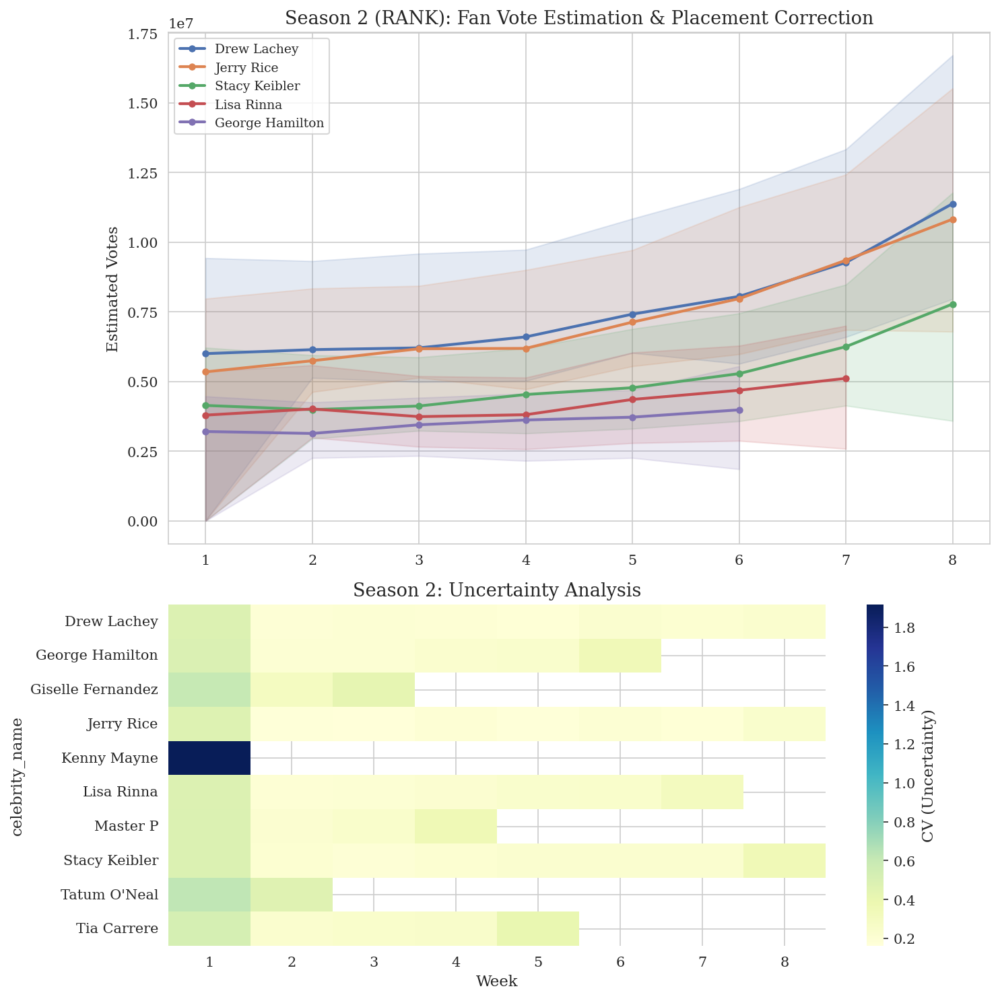


--- Processing Season 3 ---


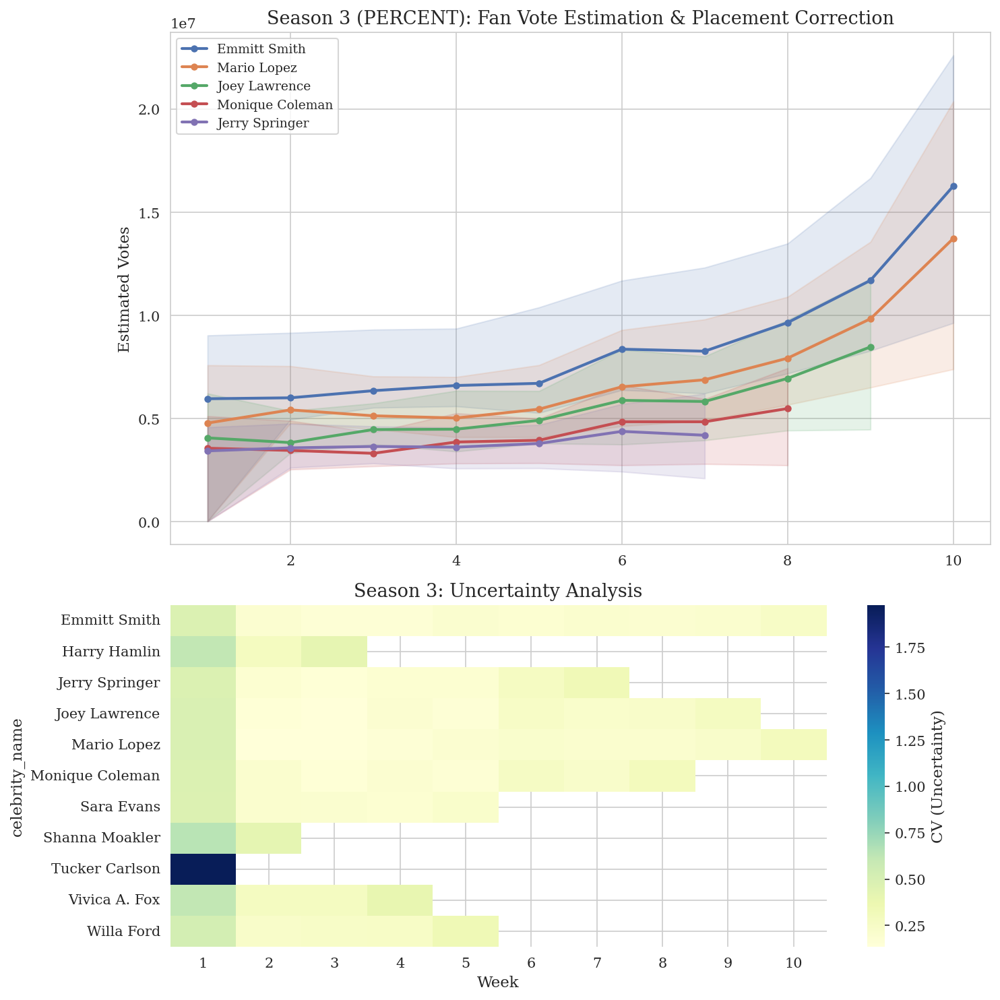


--- Processing Season 4 ---


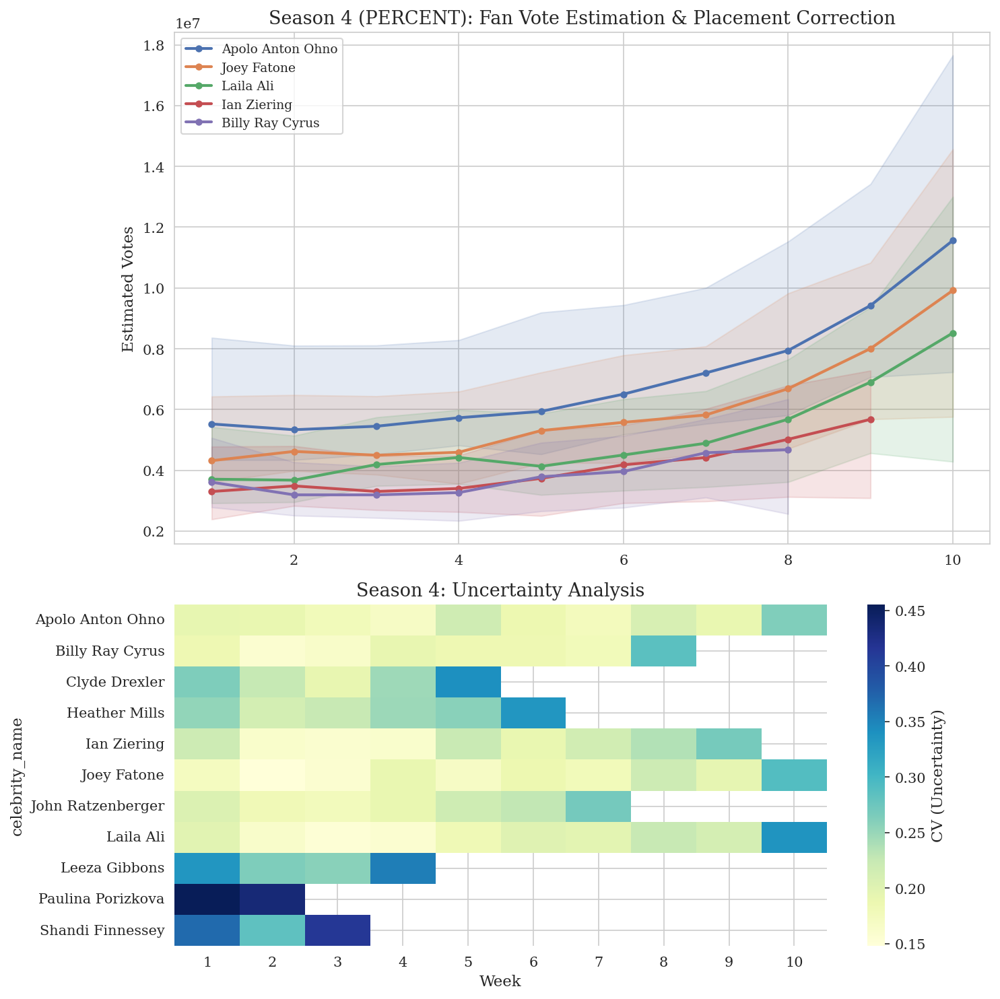


--- Processing Season 5 ---


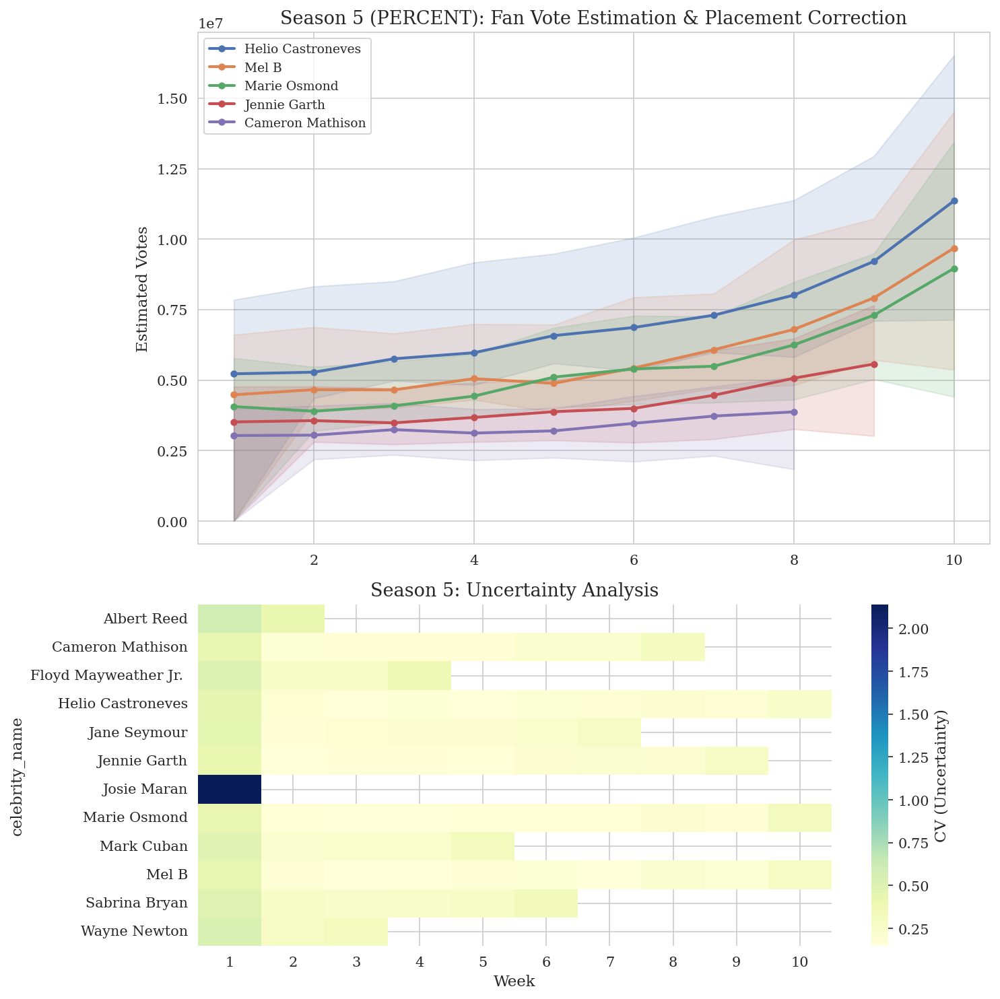


--- Processing Season 6 ---


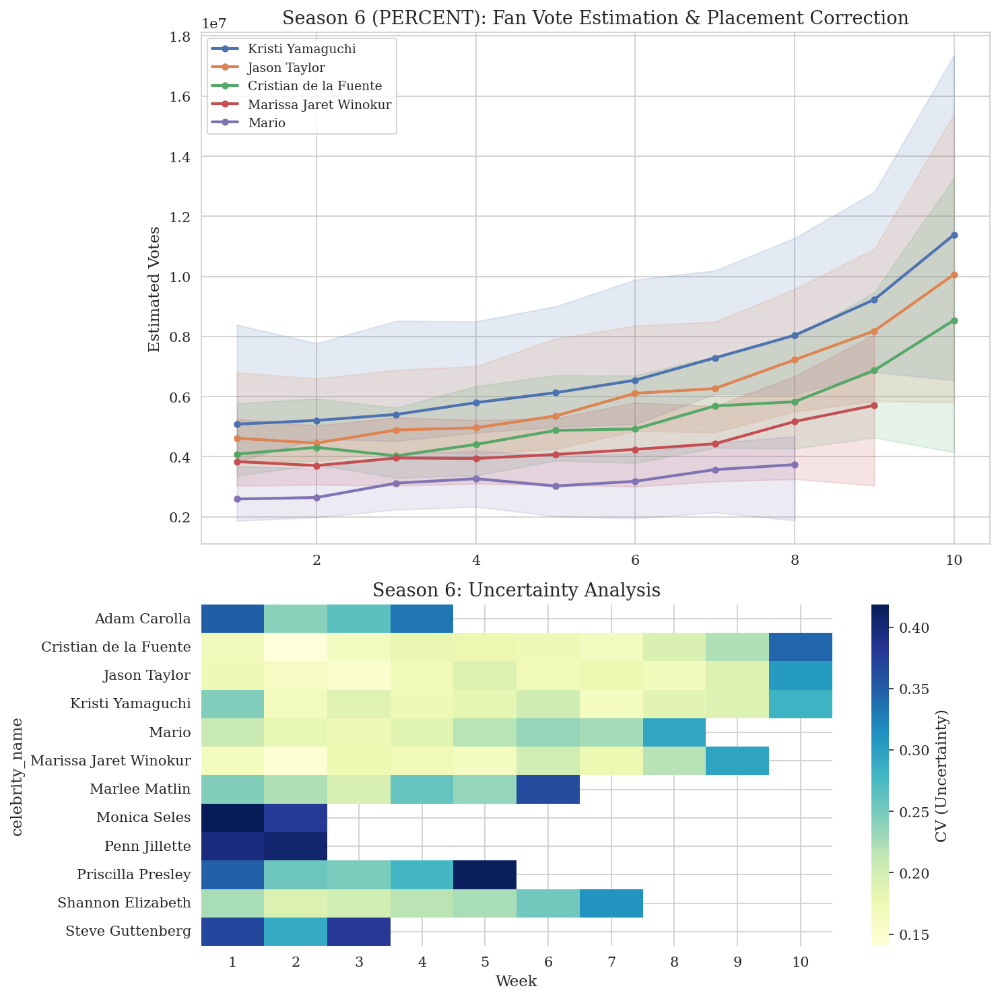


--- Processing Season 7 ---


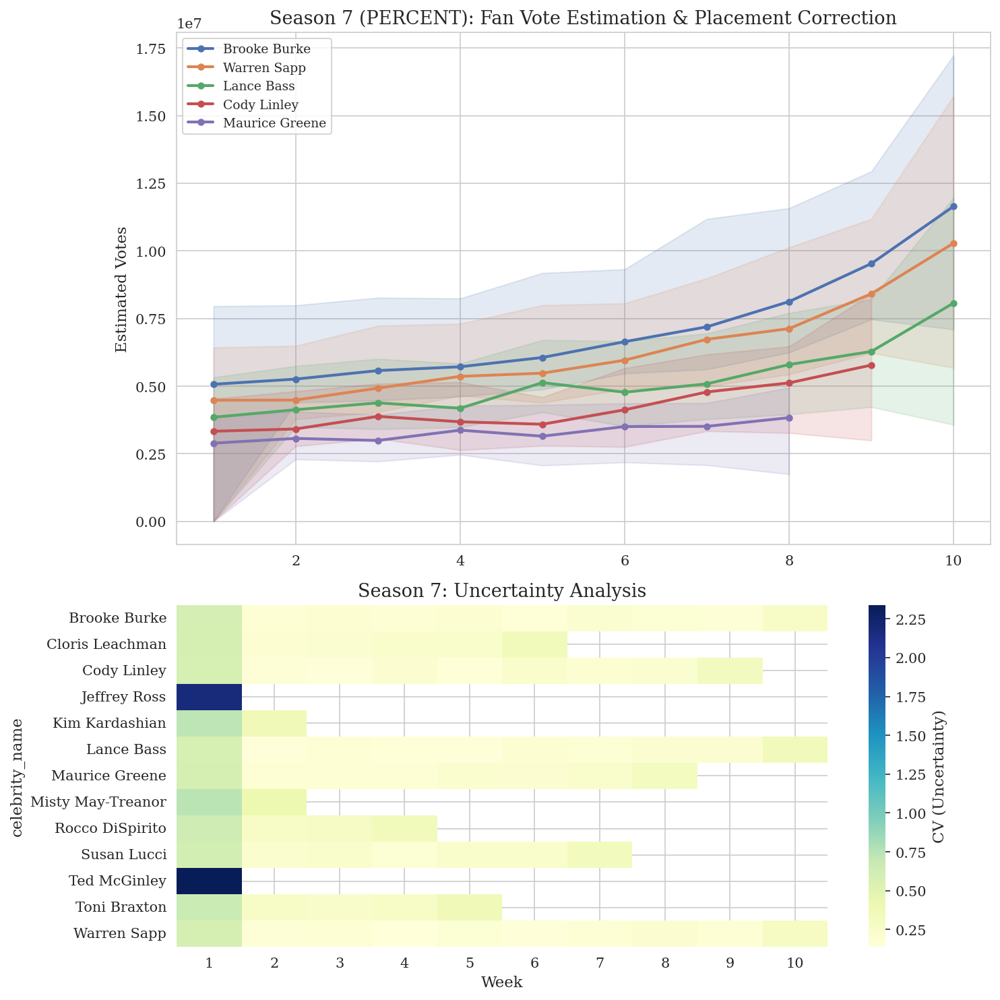


--- Processing Season 8 ---


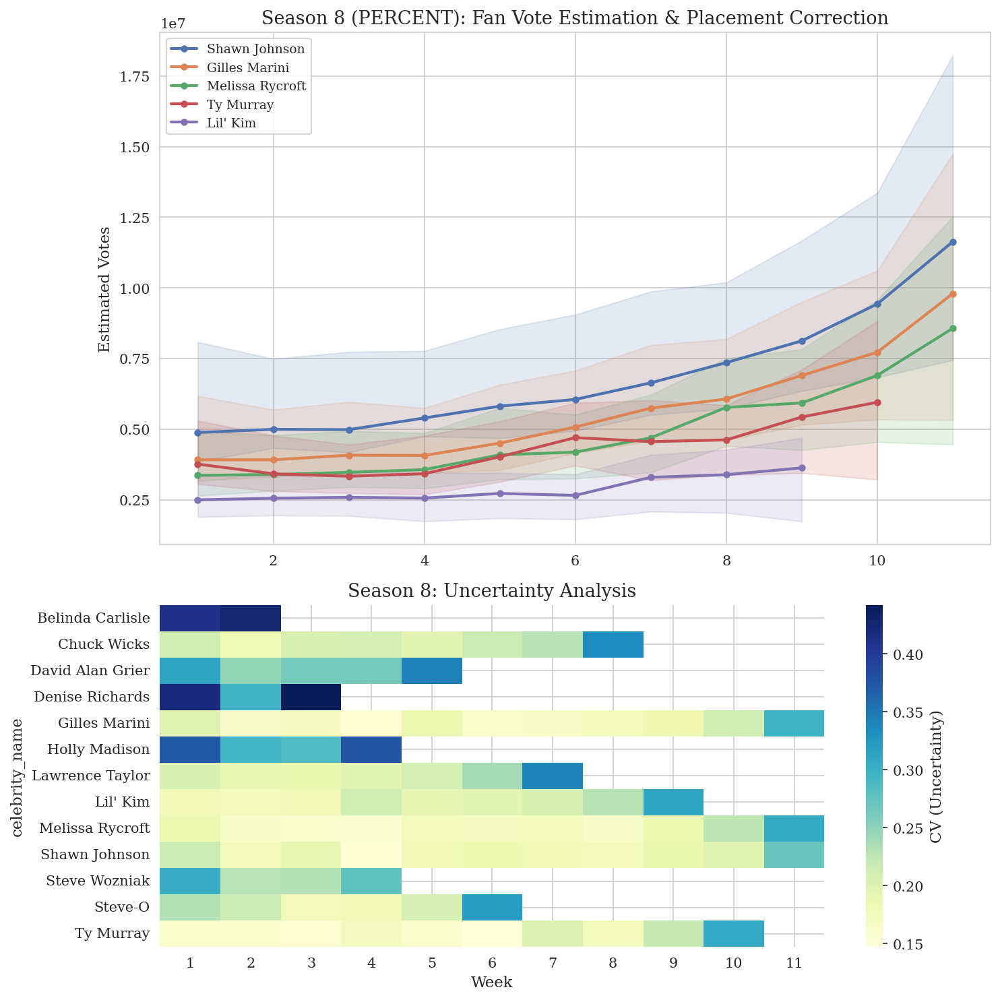


--- Processing Season 9 ---


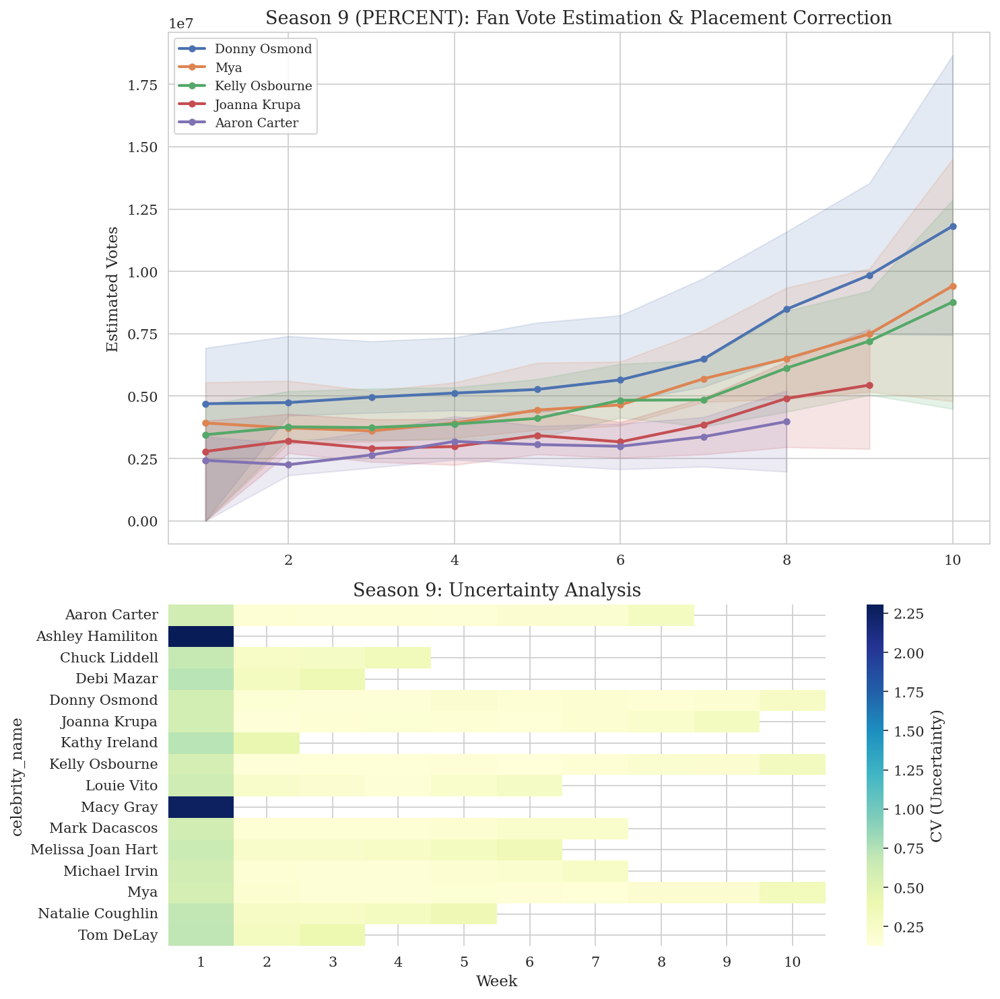


--- Processing Season 10 ---


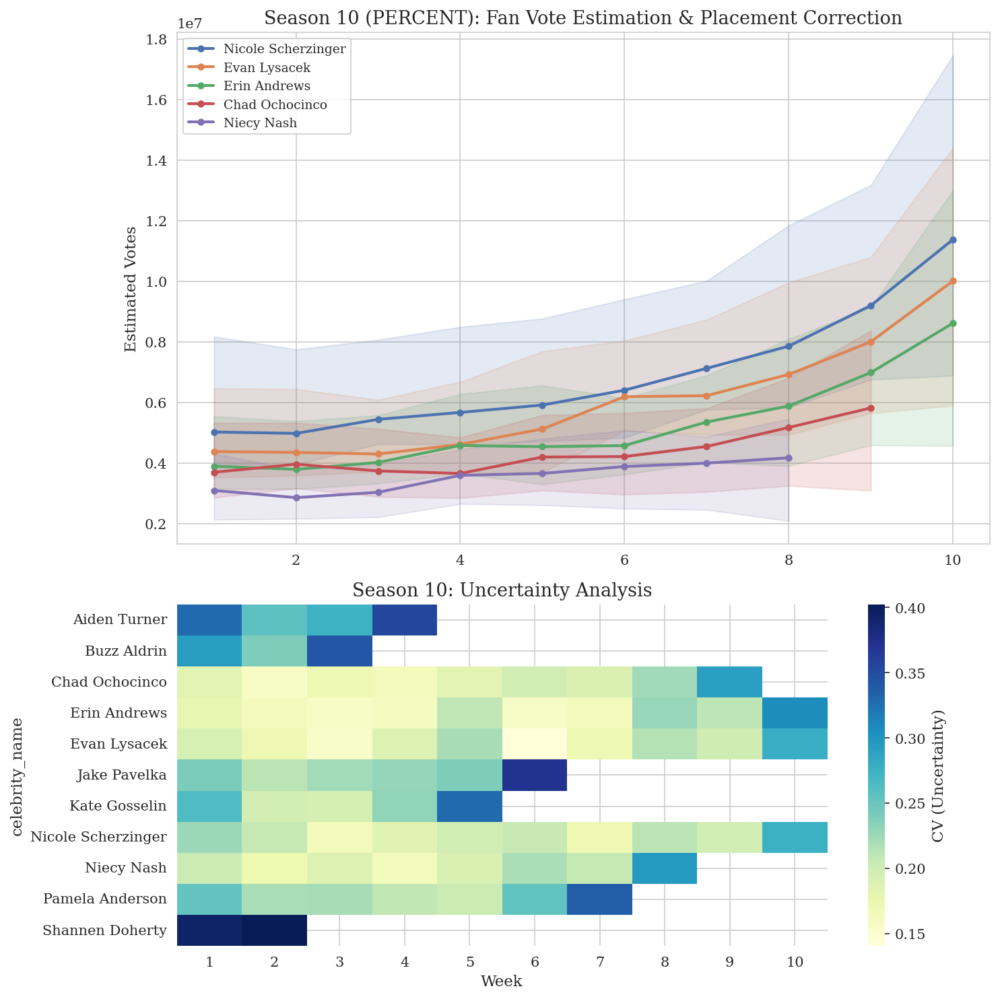


--- Processing Season 11 ---


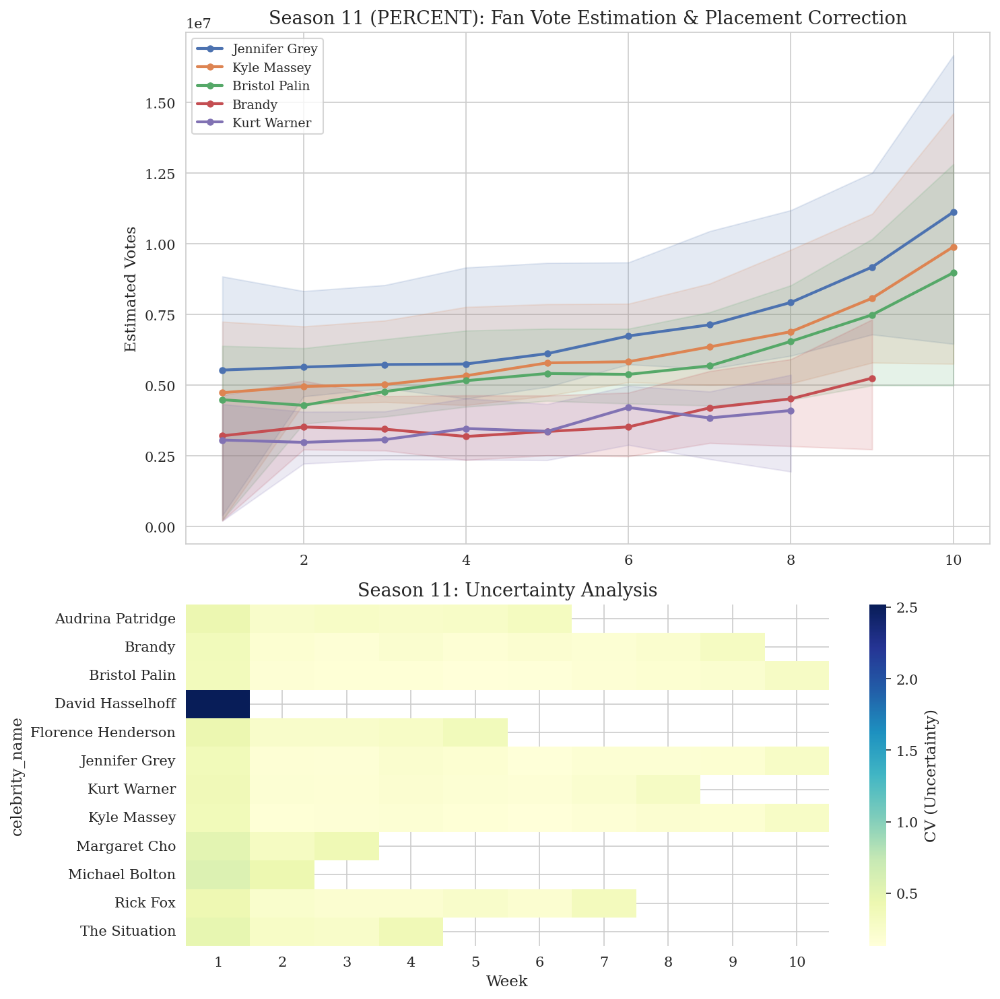


--- Processing Season 12 ---


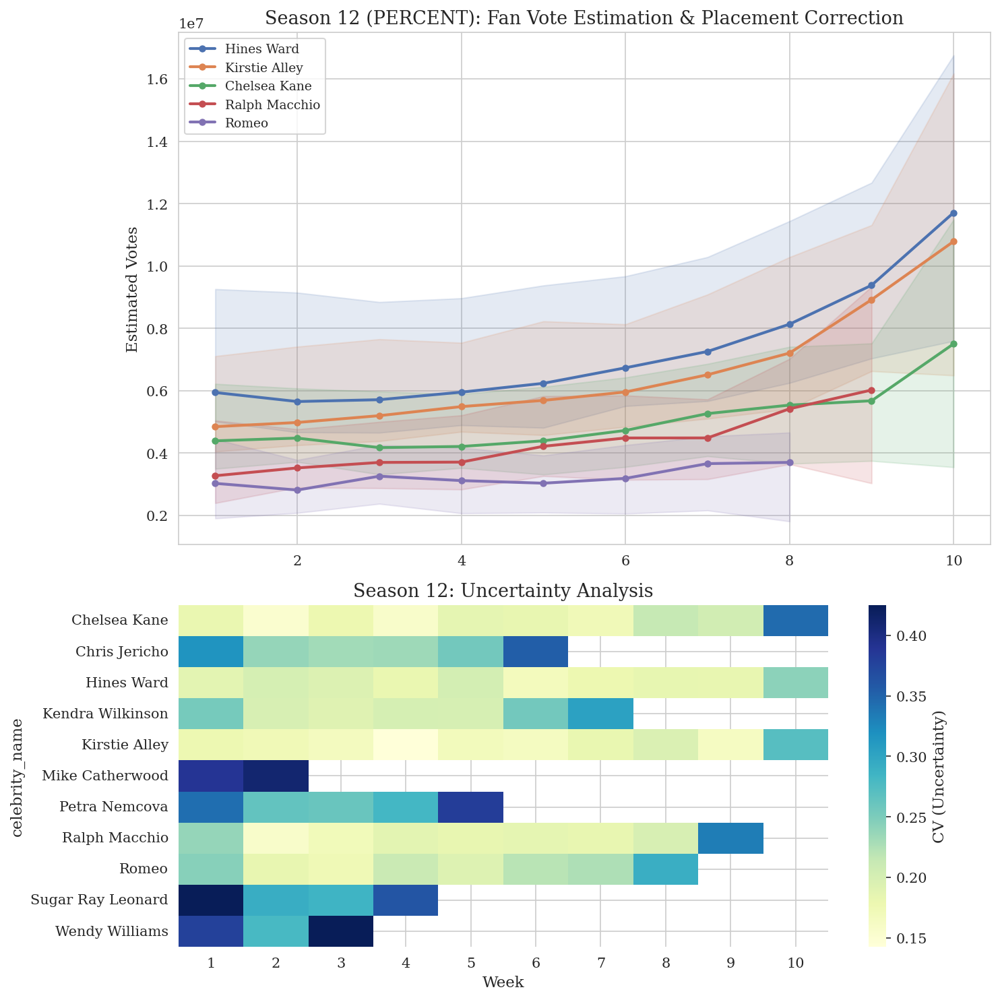


--- Processing Season 13 ---


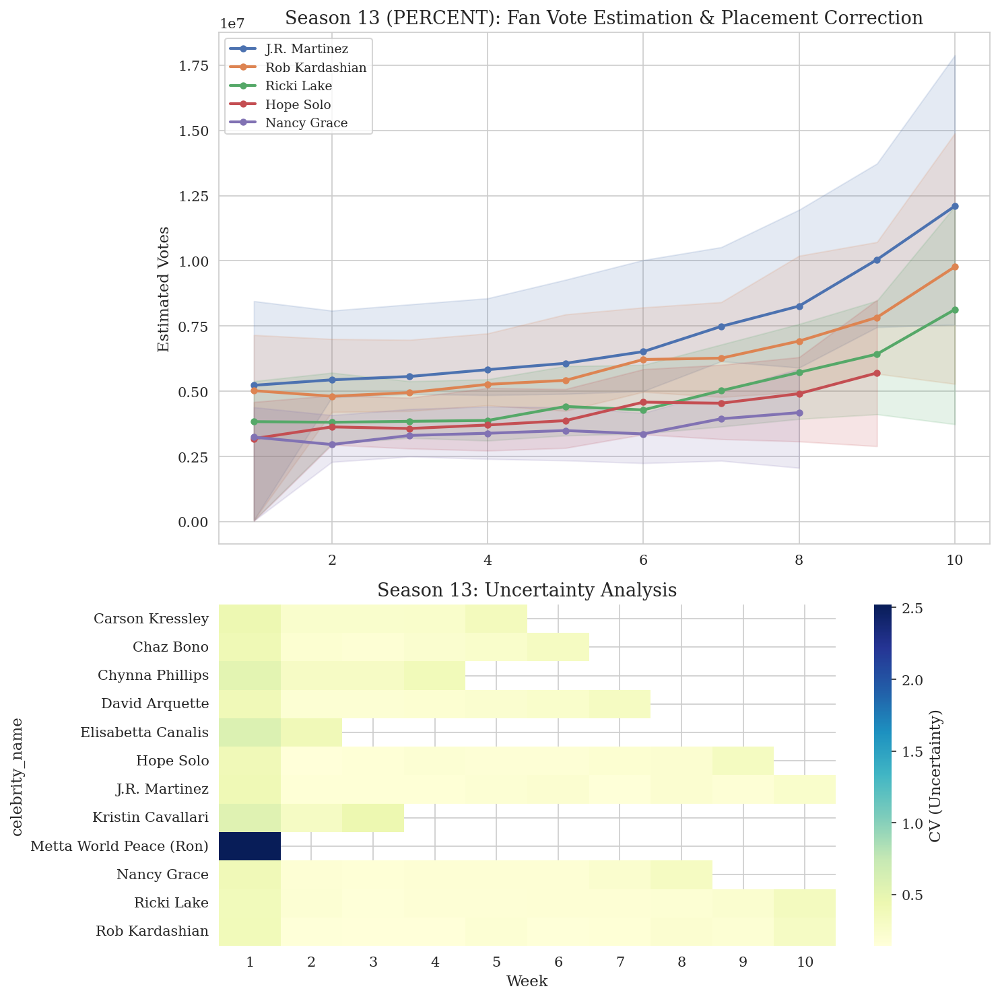


--- Processing Season 14 ---


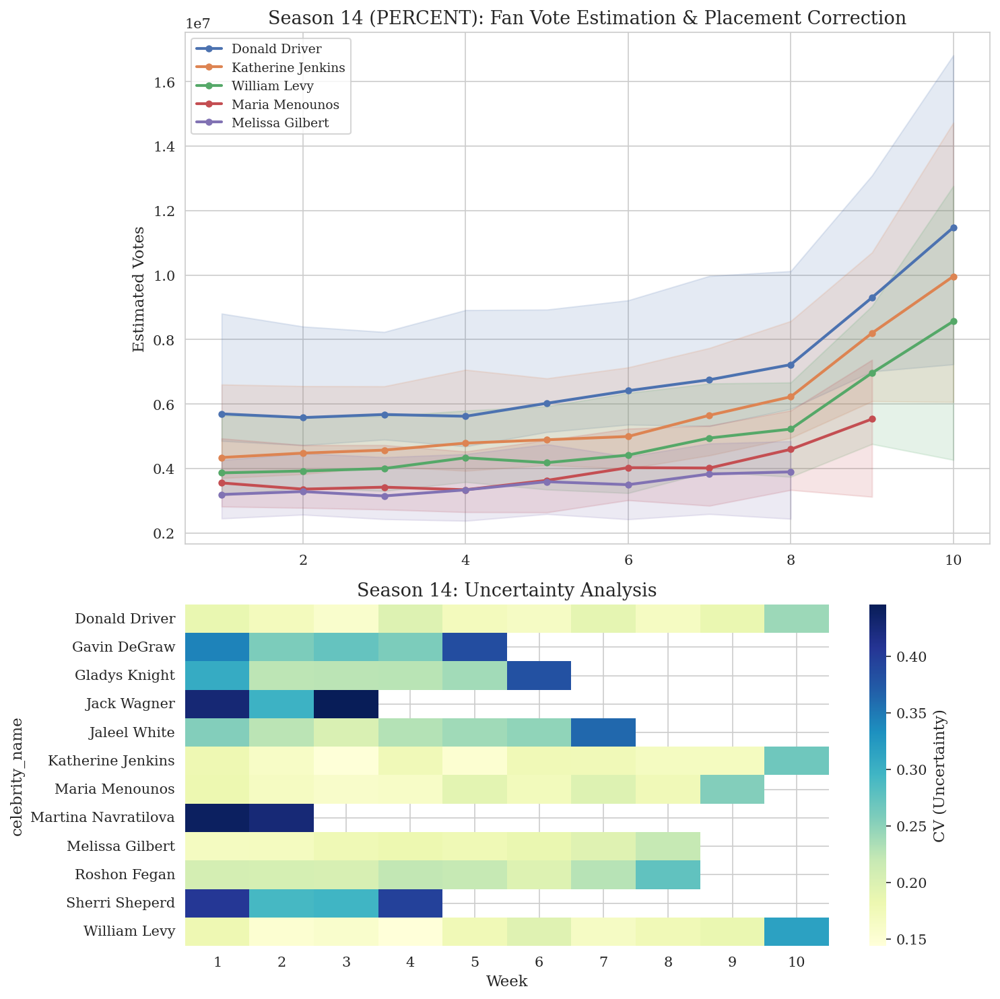


--- Processing Season 15 ---


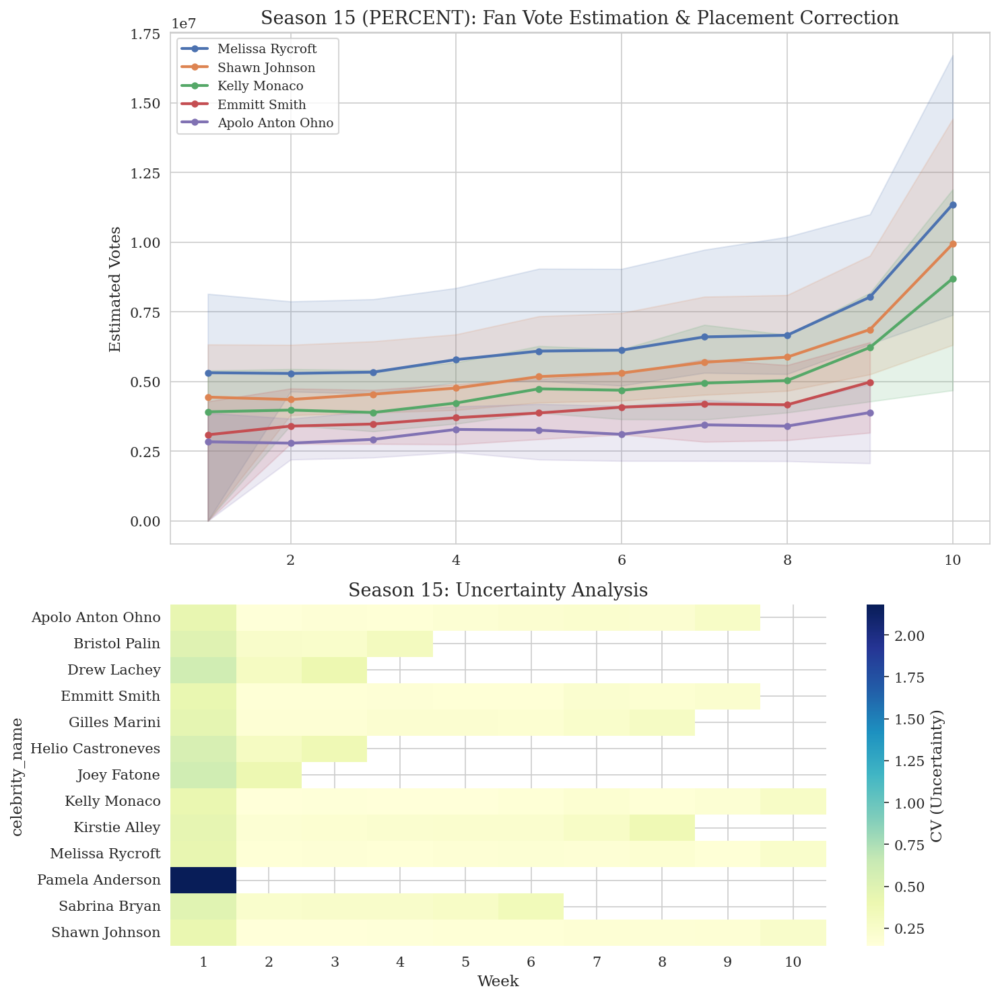


--- Processing Season 16 ---


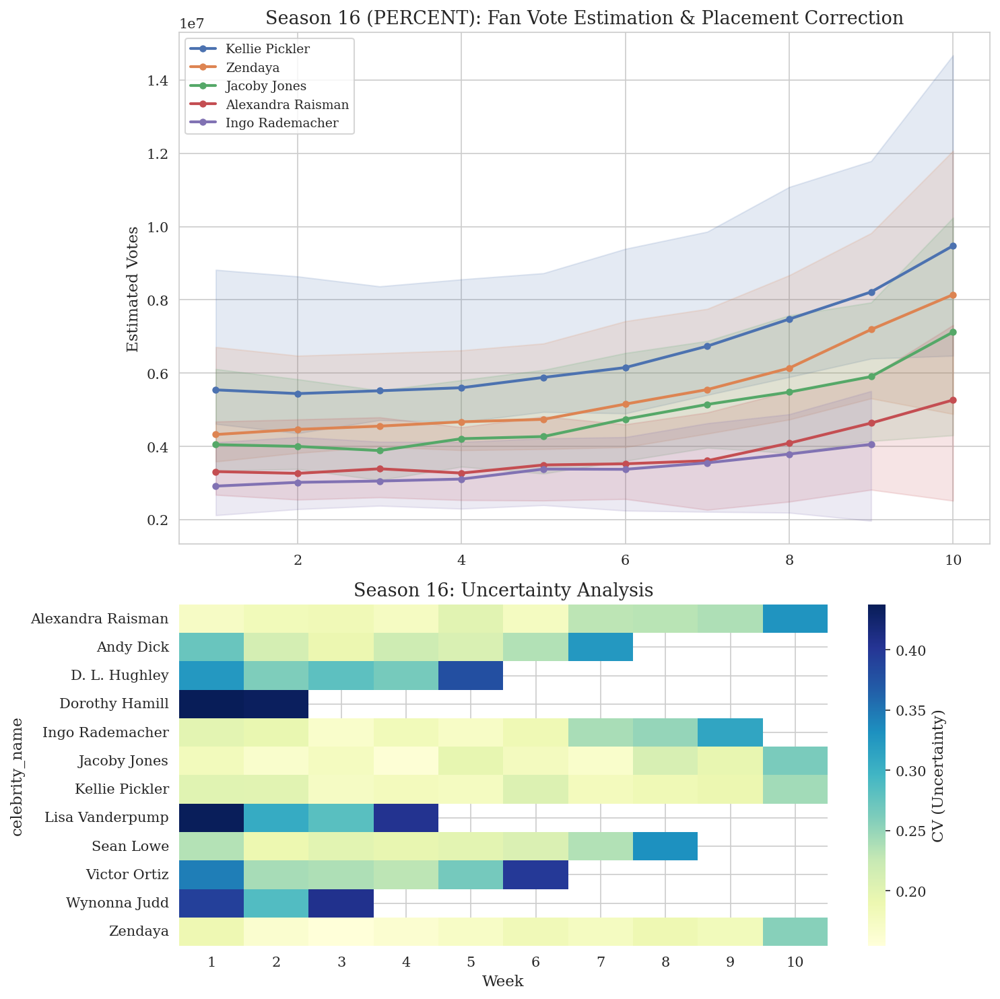


--- Processing Season 17 ---


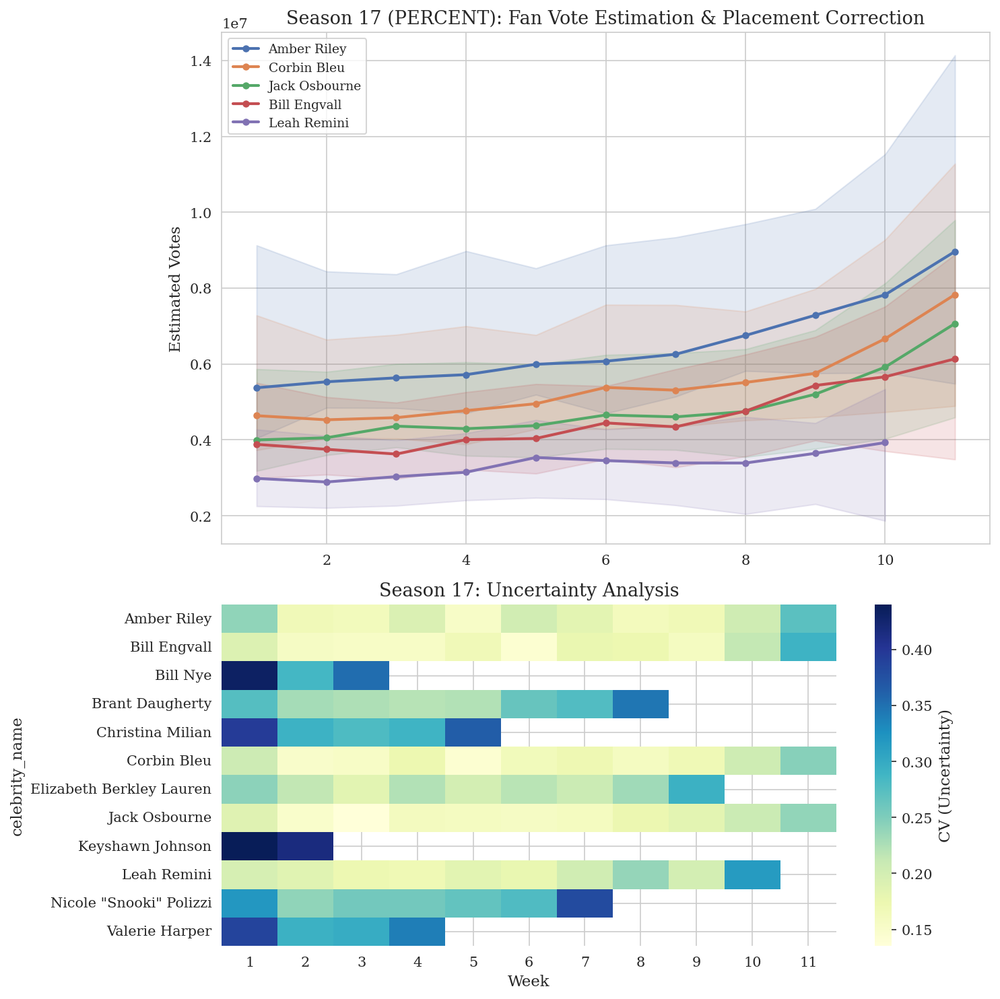


--- Processing Season 18 ---


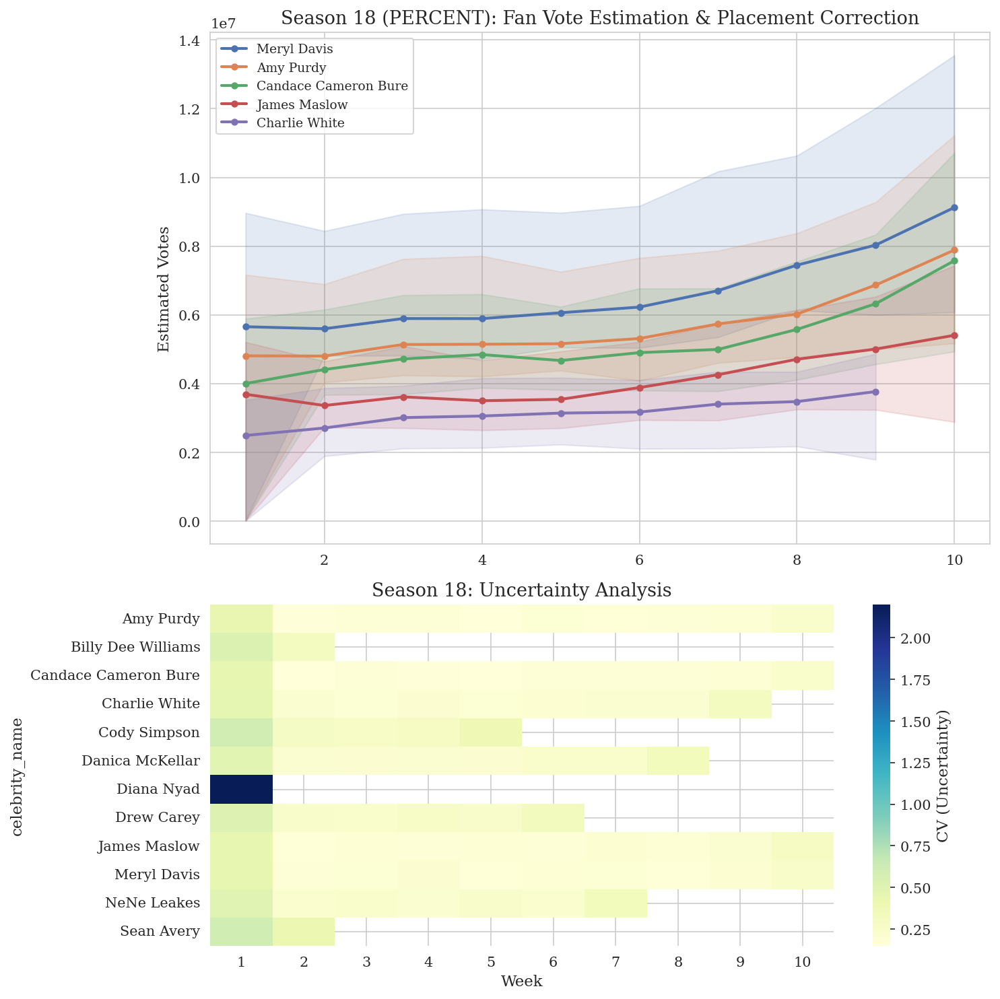


--- Processing Season 19 ---


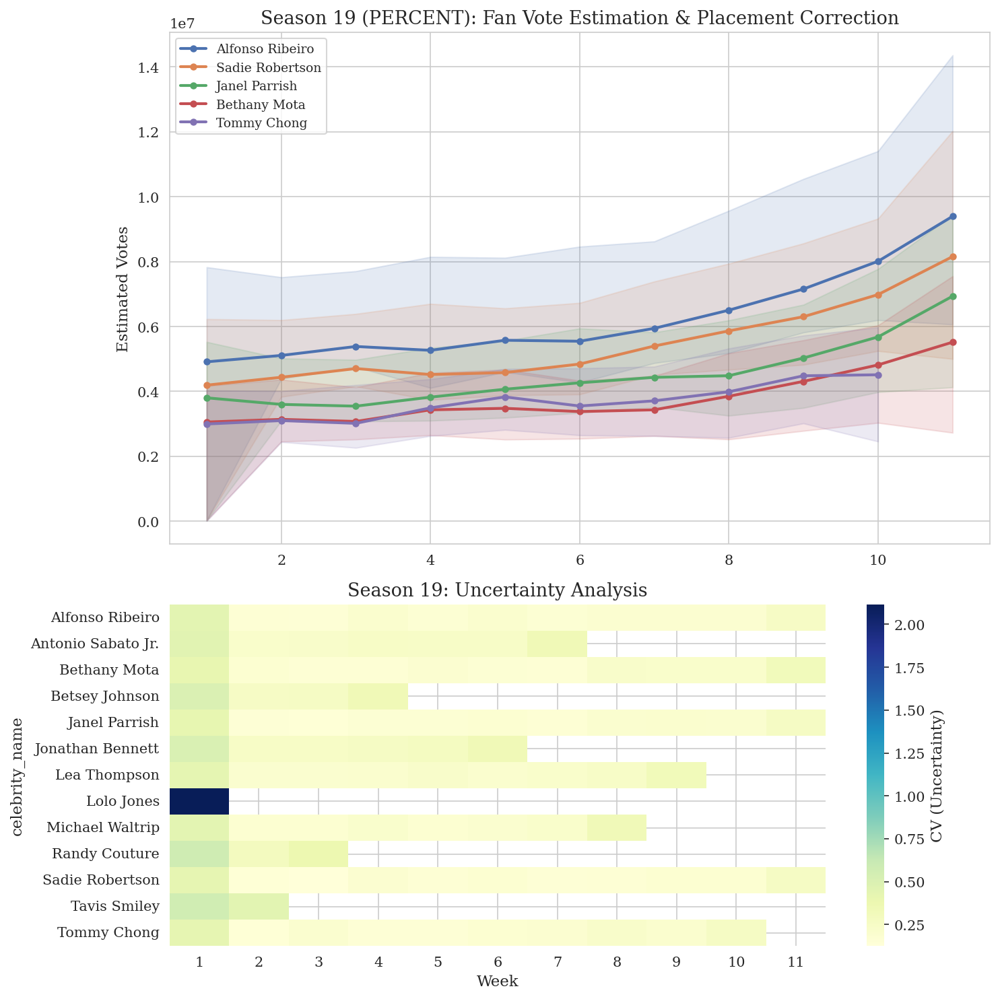


--- Processing Season 20 ---


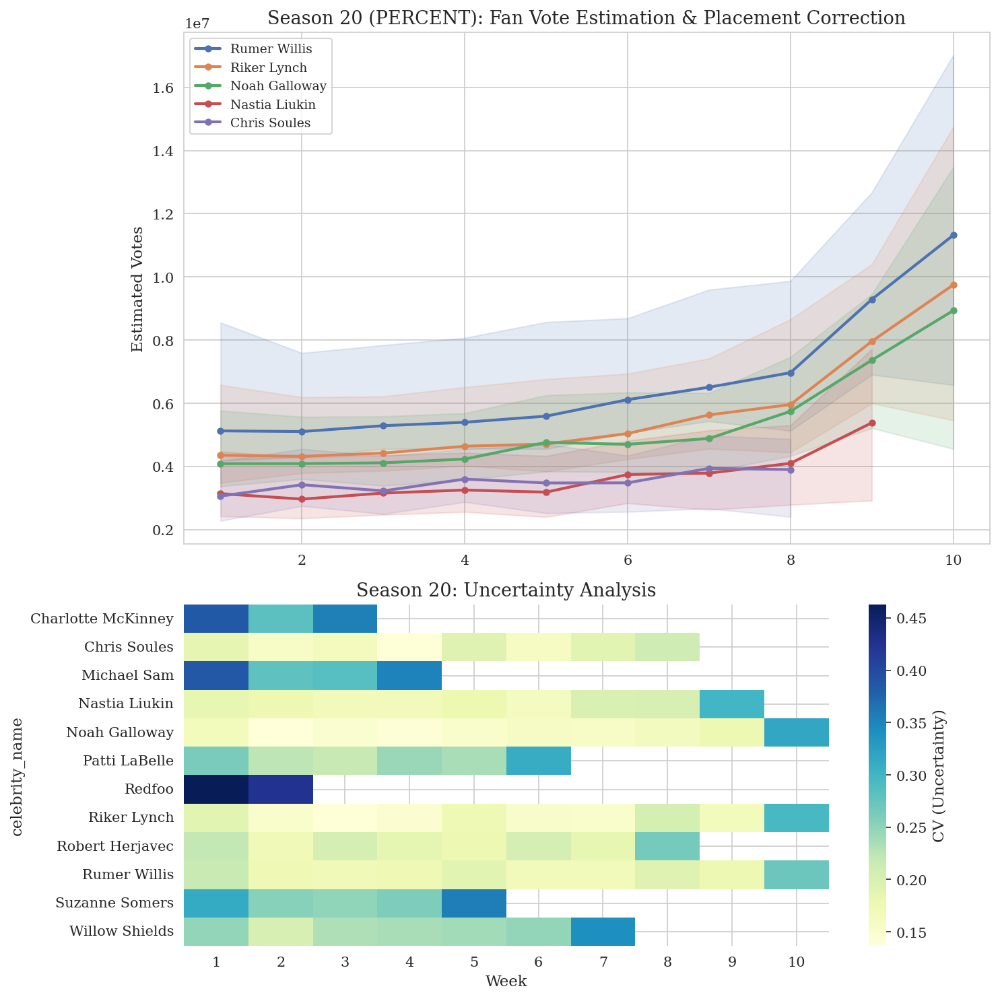


--- Processing Season 21 ---


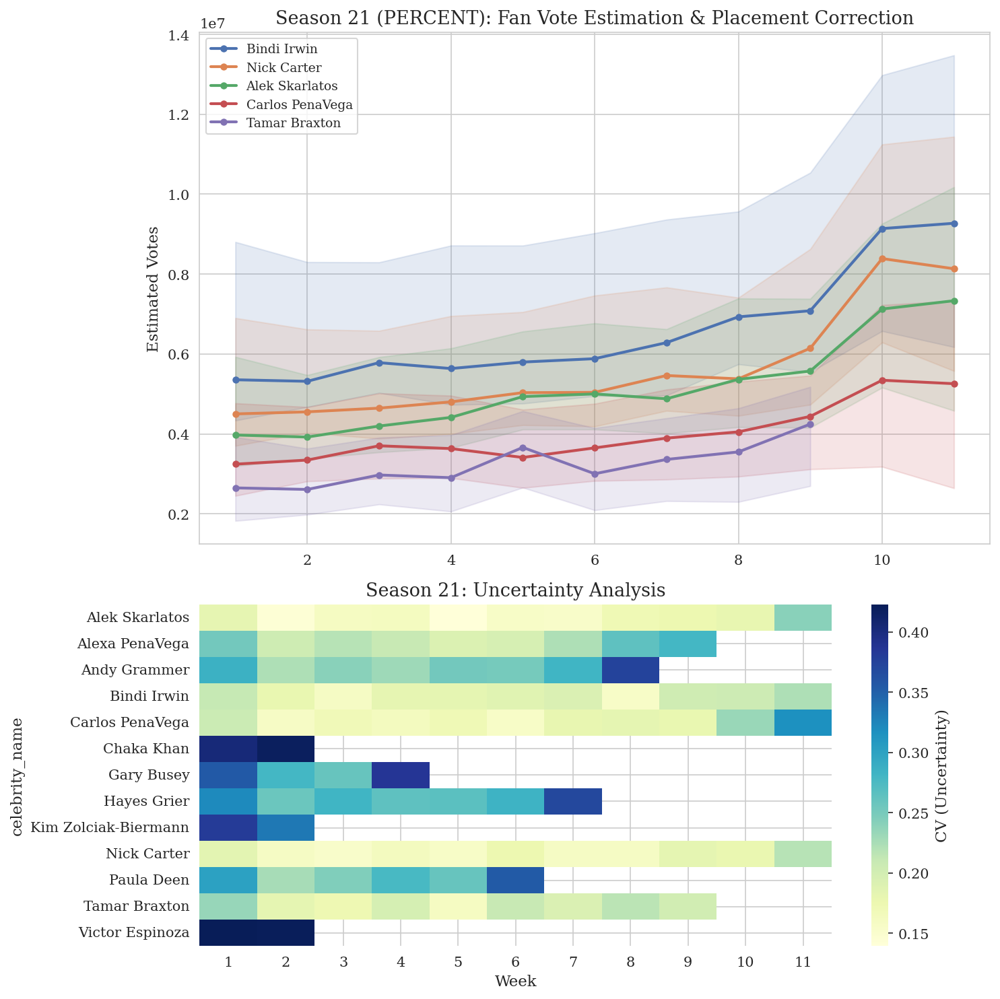


--- Processing Season 22 ---


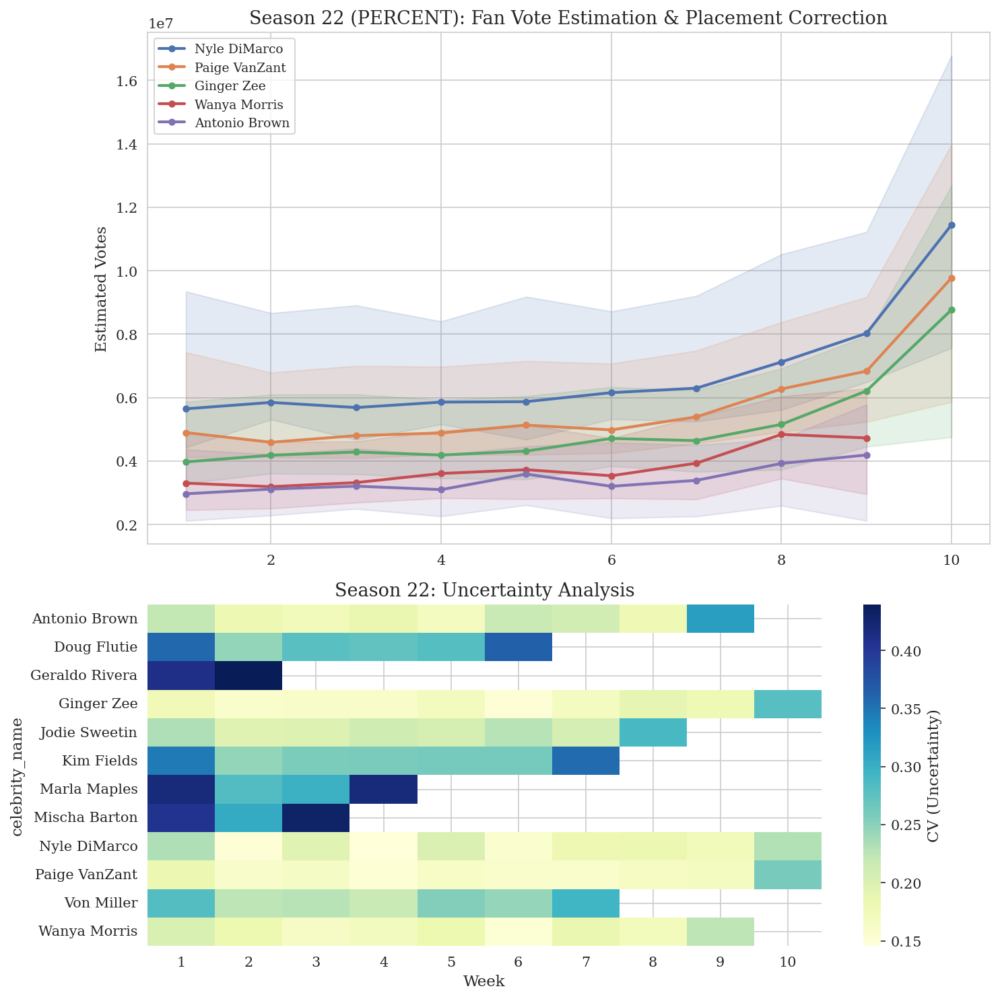


--- Processing Season 23 ---


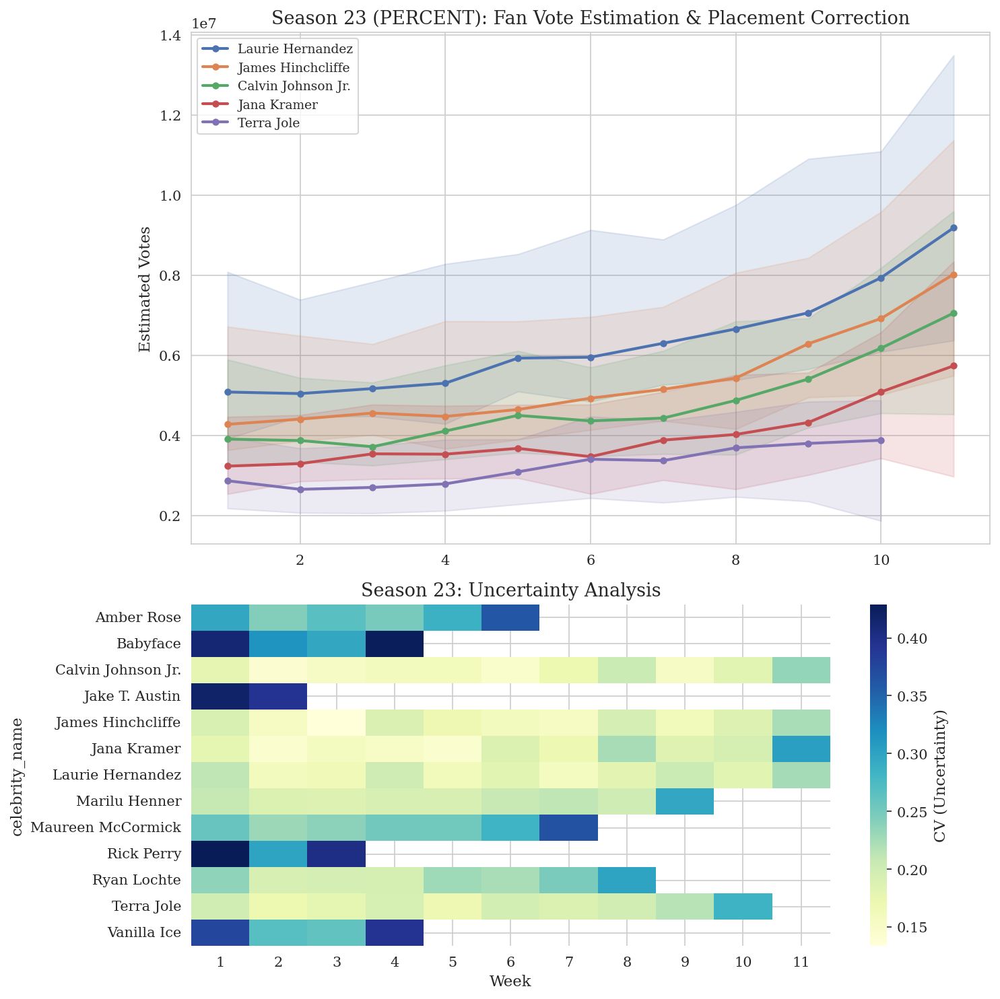


--- Processing Season 24 ---


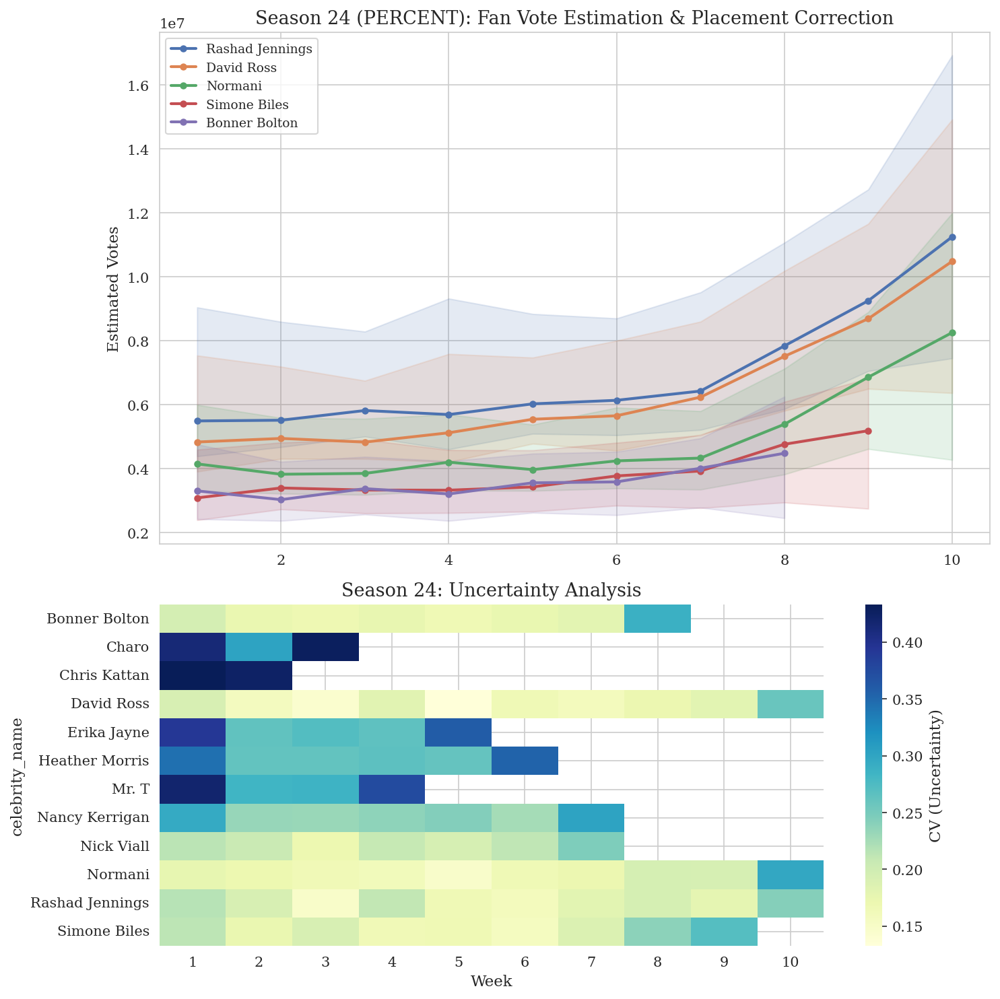


--- Processing Season 25 ---


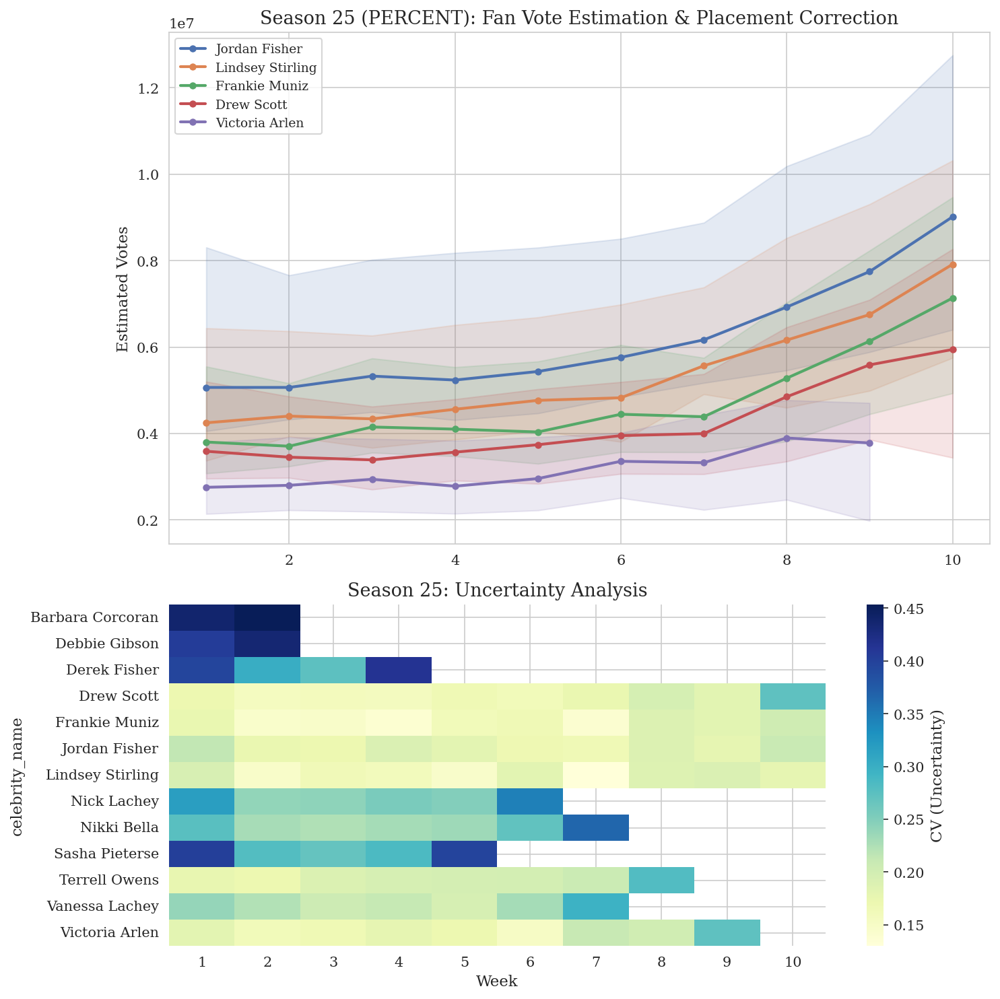


--- Processing Season 26 ---


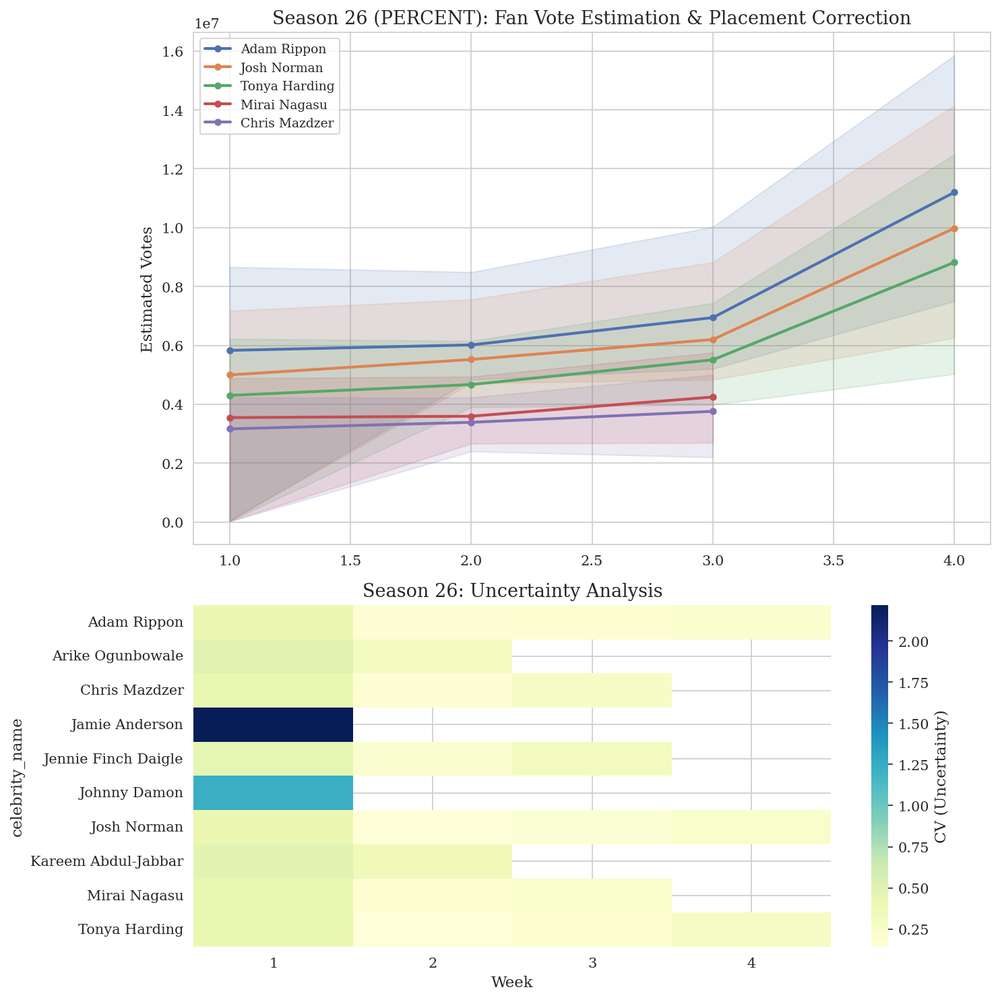


--- Processing Season 27 ---


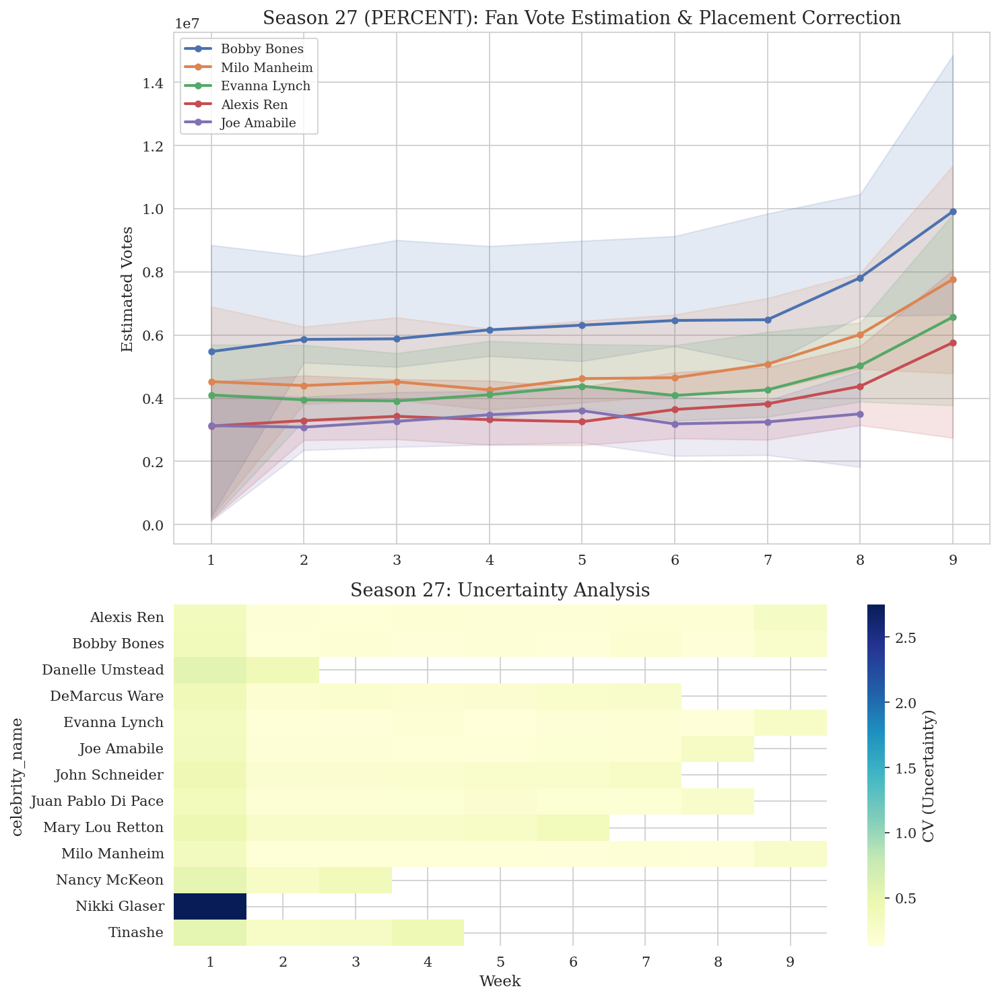


--- Processing Season 28 ---


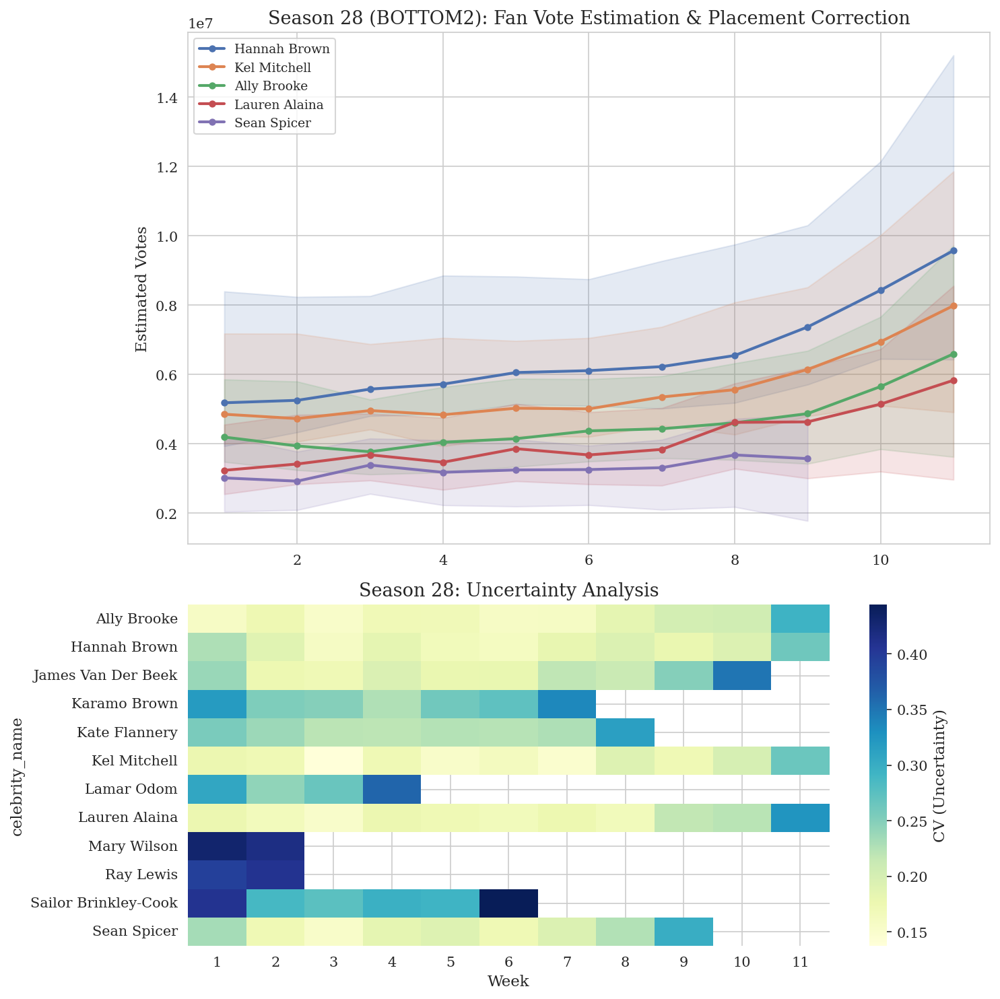


--- Processing Season 29 ---


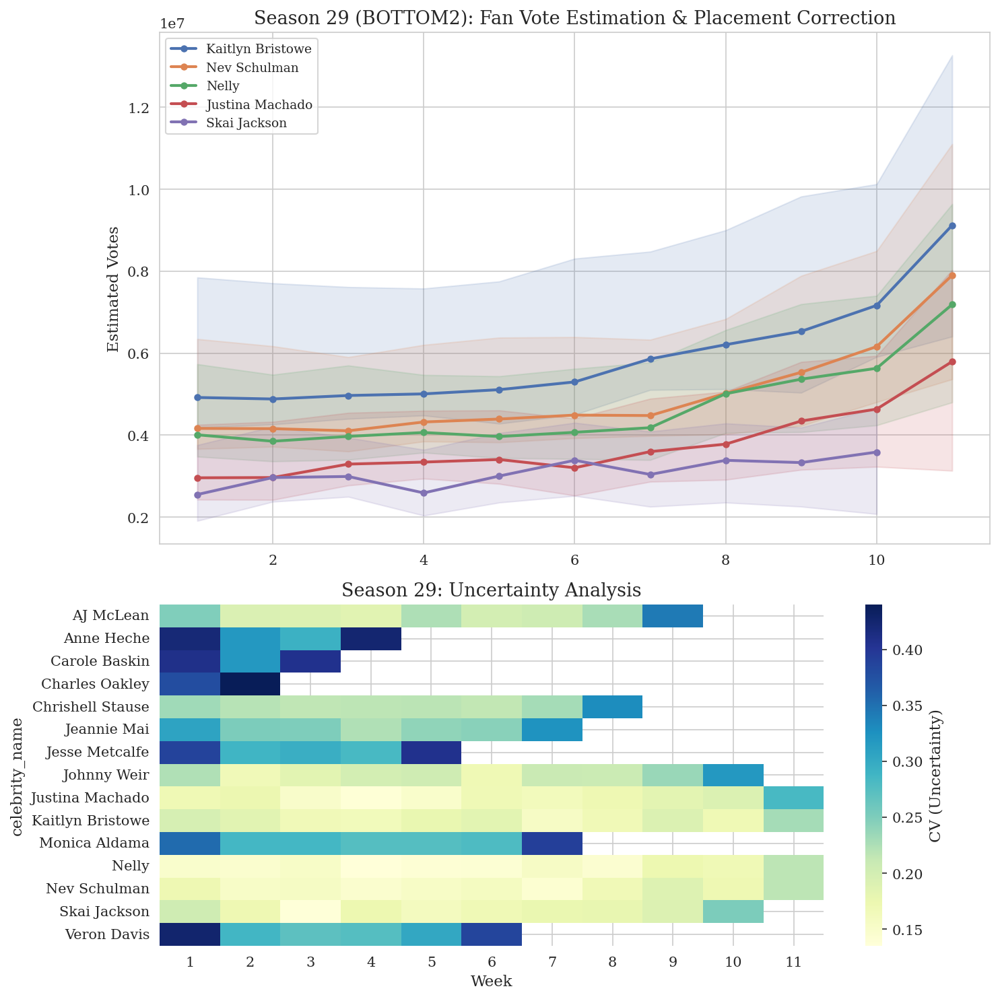


--- Processing Season 30 ---


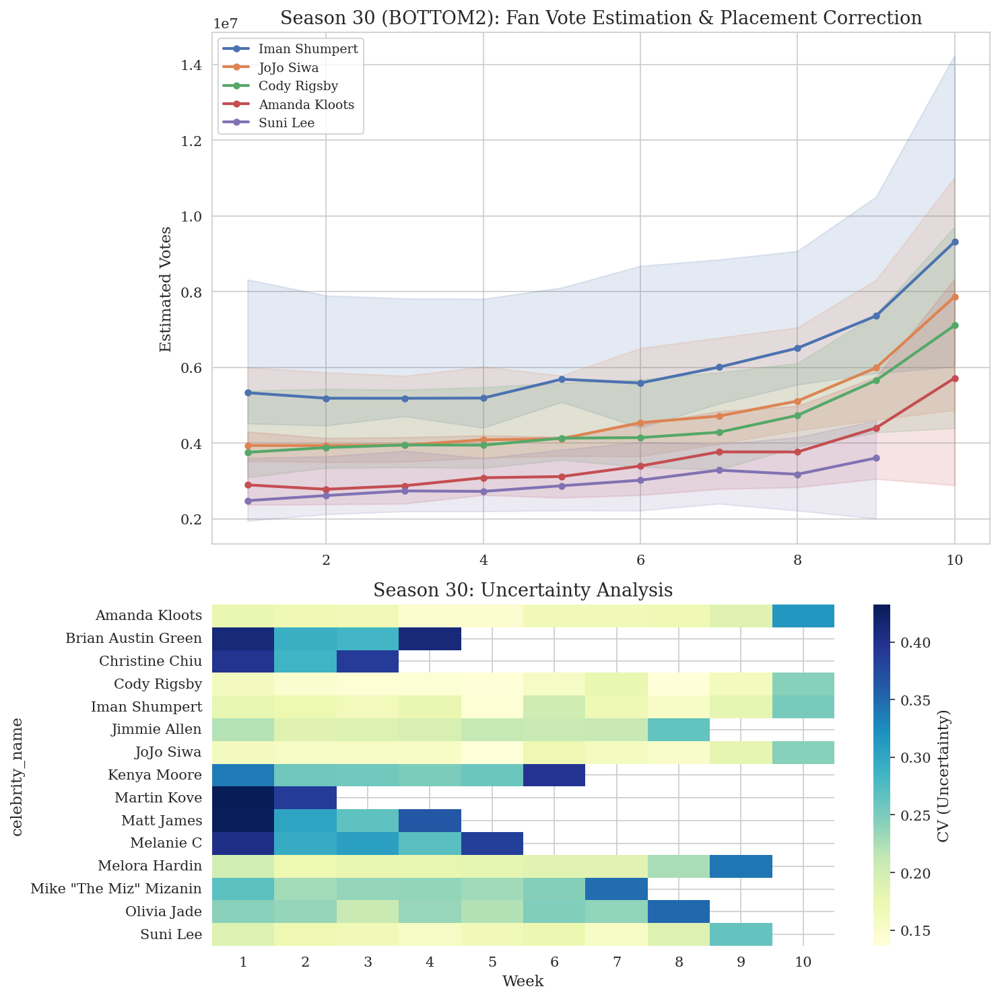


--- Processing Season 31 ---


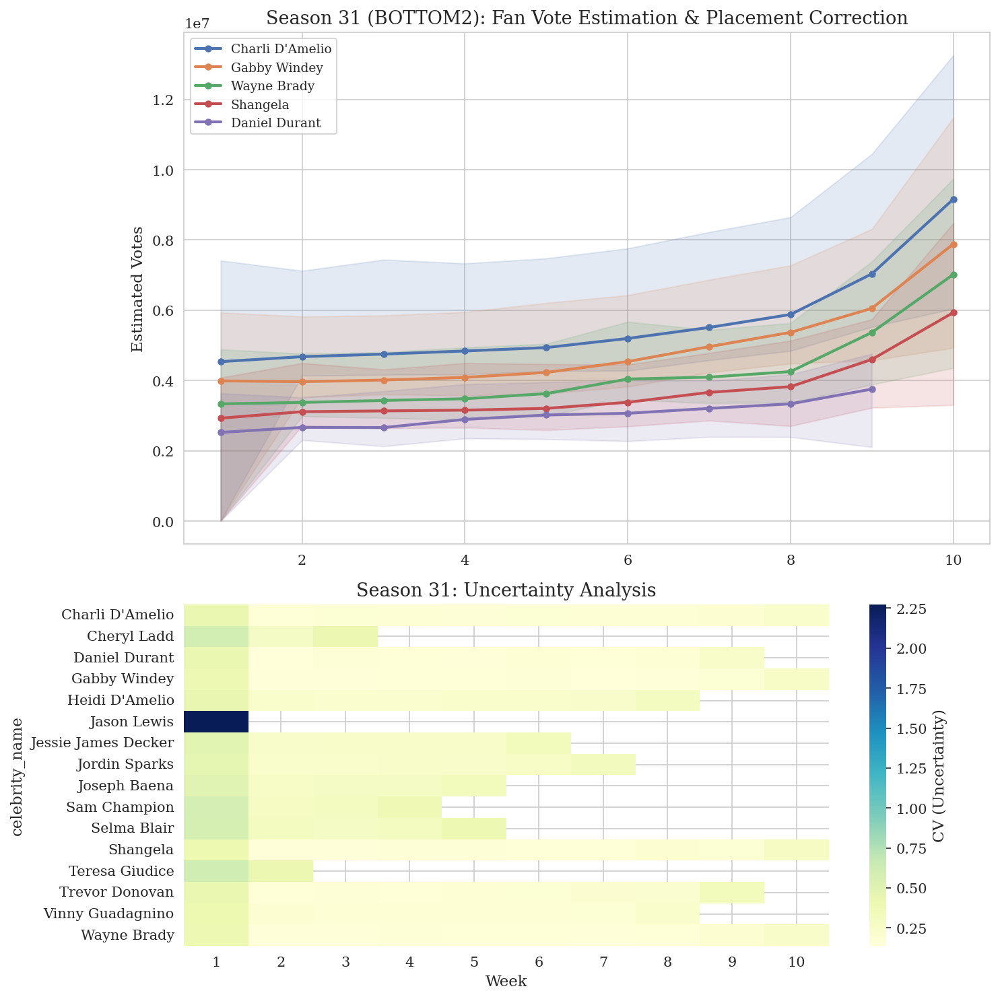


--- Processing Season 32 ---


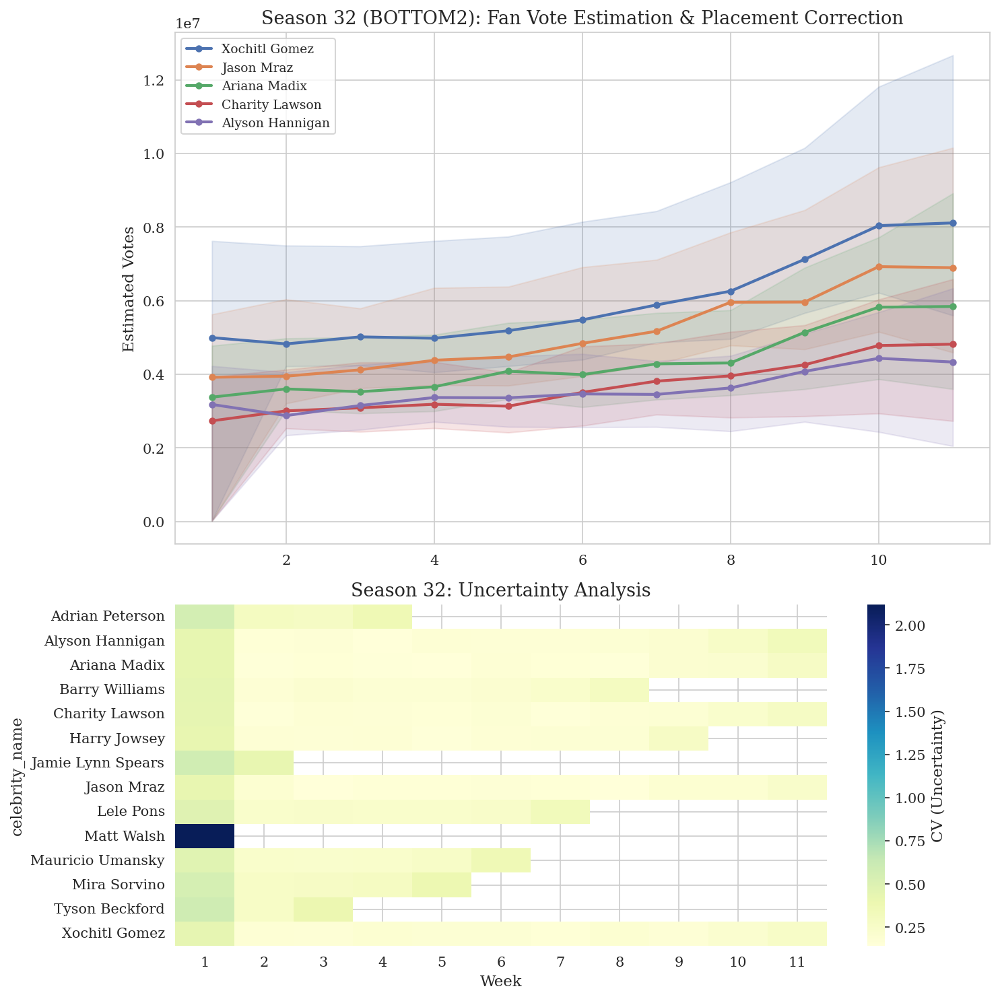


--- Processing Season 33 ---


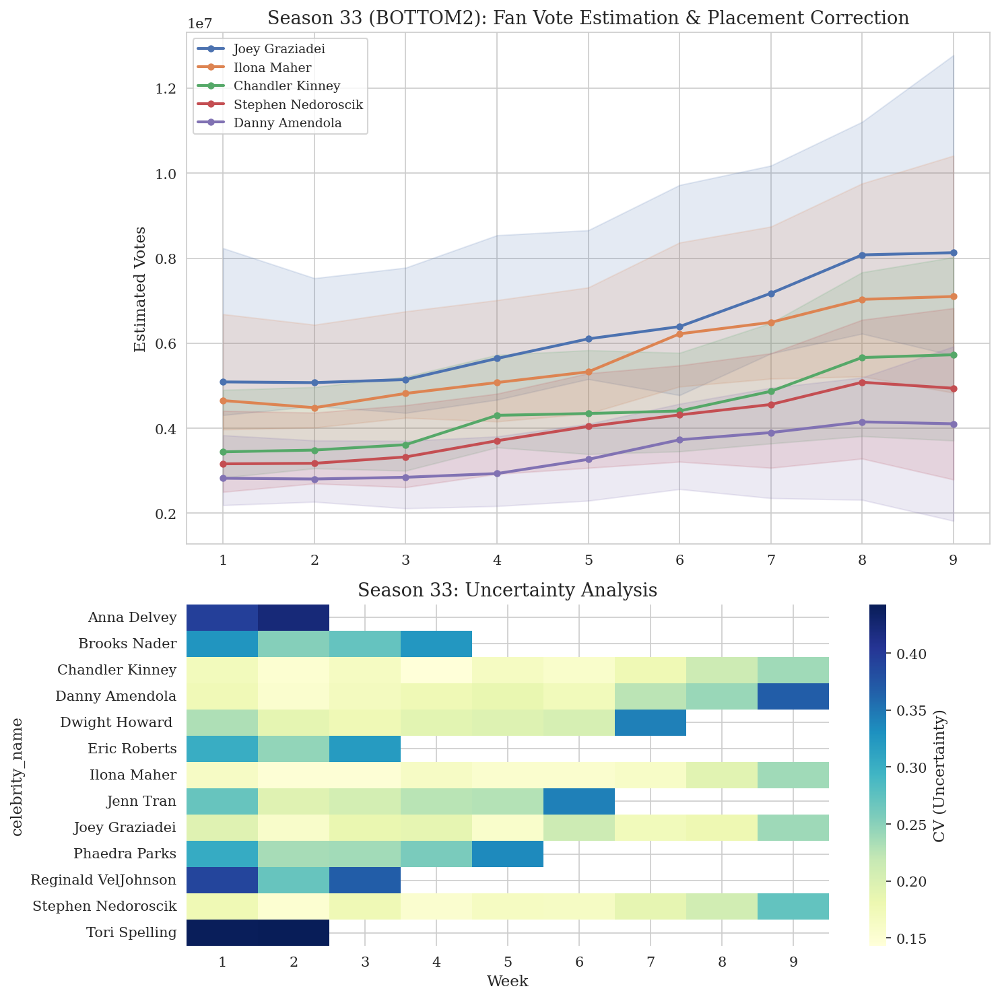


--- Processing Season 34 ---


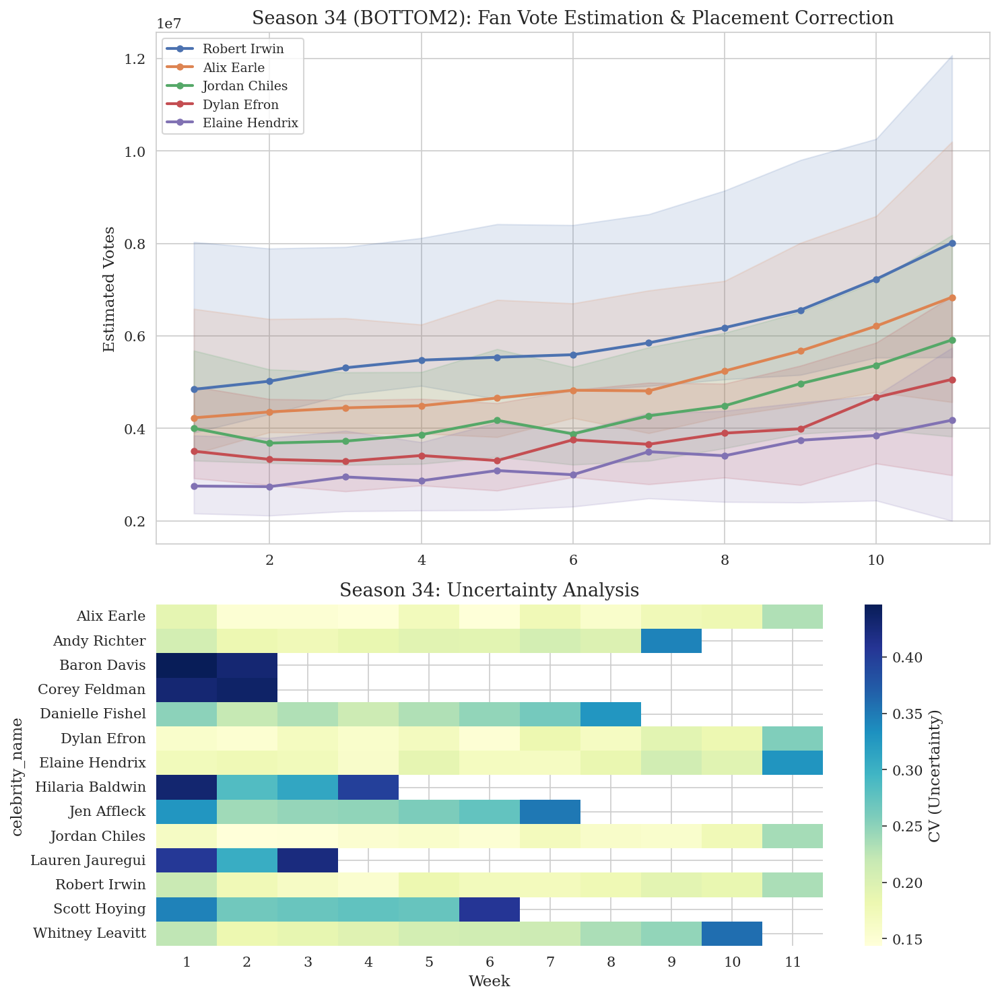


=== Survival Hit Rate ===
 season  hit_rate  avg_margin
      1  1.000000    0.070696
      2  1.000000    0.049255
      3  1.000000    0.032565
      4  1.000000    0.029181
      5  1.000000    0.024241
      6  1.000000    0.027086
      7  1.000000    0.033873
      8  1.000000    0.030473
      9  0.888889    0.021431
     10  1.000000    0.032892
     11  1.000000    0.029798
     12  1.000000    0.035368
     13  1.000000    0.032409
     14  1.000000    0.027522
     15  1.000000    0.018802
     16  1.000000    0.038002
     17  1.000000    0.023336
     18  1.000000    0.026269
     19  1.000000    0.023844
     20  0.875000    0.019411
     21  1.000000    0.027189
     22  1.000000    0.018950
     23  1.000000    0.022724
     24  1.000000    0.022066
     25  1.000000    0.022077
     26  1.000000    0.027660
     27  1.000000    0.014821
     28  1.000000    0.026997
     29  1.000000    0.018606
     30  0.875000    0.020424
     31  0.777778    0.014168
     32  1.00

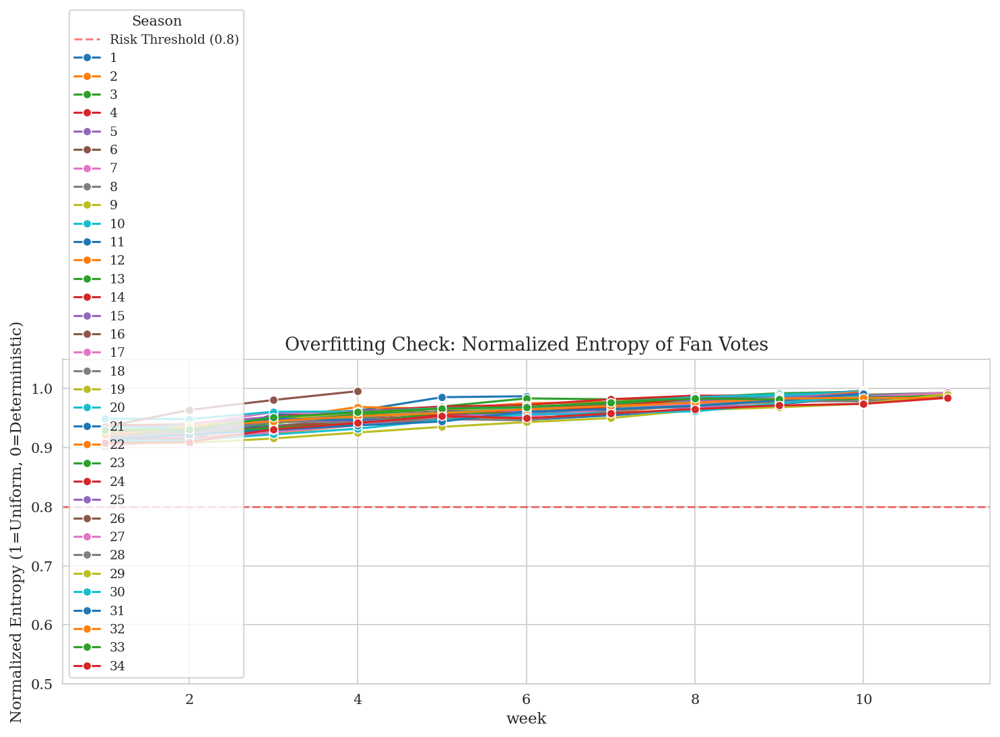


=== Overfitting Check Table ===
 Season  Weeks  Avg Entropy  Min Entropy  Volatility
      1      6     0.953210     0.913147    0.032739
      2      8     0.958410     0.913041    0.025663
      3     10     0.964163     0.912643    0.029023
      4     10     0.968452     0.937914    0.020078
      5     10     0.963808     0.927939    0.021531
      6     10     0.962077     0.927377    0.022919
      7     10     0.962412     0.916058    0.022221
      8     11     0.964610     0.934747    0.019823
      9     10     0.960075     0.916117    0.024228
     10     10     0.969967     0.948249    0.016160
     11     10     0.957100     0.915890    0.026736
     12     10     0.956354     0.921157    0.024288
     13     10     0.960035     0.914224    0.024794
     14     10     0.956231     0.919499    0.026060
     15     10     0.959416     0.918146    0.022971
     16     10     0.956863     0.921293    0.023157
     17     11     0.953678     0.920764    0.024662
     18     1

In [5]:
import numpy as np
import pandas as pd
from scipy.optimize import minimize
from scipy.stats import rankdata, entropy
import matplotlib.pyplot as plt
import seaborn as sns
from dataclasses import dataclass
from typing import Dict, List, Tuple, Optional
import warnings

# 忽略数值计算警告
warnings.filterwarnings('ignore')

# -----------------------
# 全局常量
# -----------------------
TOTAL_VOTES = 30_000_000  # 假设每周 3000 万票
SEED = 2026

# -----------------------
# 0) 数据结构与预处理
# -----------------------

@dataclass
class WeekEvent:
    season: int
    week: int
    rule: str               # "RANK", "PERCENT", "BOTTOM2"
    active_names: List[str] # 当周参赛选手
    eliminated: List[str]   # 当周淘汰者
    j_scores: np.ndarray    # 评委原始分
    j_percent: np.ndarray   # 评委分占比
    j_rank: np.ndarray      # 评委排名 (1=Best)
    placements: np.ndarray  # [核心修复] 最终名次 (1=Winner, 999=Unknown)
    k_elim: int             # 淘汰人数
    is_z_week: bool         # 是否无淘汰周

def get_season_rule(season: int) -> str:
    if season <= 2: return "RANK"
    elif season <= 27: return "PERCENT"
    else: return "BOTTOM2"  # S28+

def calculate_ranks_desc(scores: np.ndarray) -> np.ndarray:
    """计算排名：分数越高，排名越小(1)。"""
    return rankdata(-scores, method='min')

def load_data(csv_path: str, target_seasons: List[int]) -> Tuple[pd.DataFrame, Dict[Tuple[int, int], WeekEvent]]:
    df = pd.read_csv(csv_path)
    
    # [核心修复] 解析 placement 列，处理非数值情况
    def safe_parse_place(x):
        try:
            return float(x)
        except:
            return 999.0 # 无效或未知的名次
            
    df['placement_num'] = df['placement'].apply(safe_parse_place).fillna(999.0)

    # 转长表
    week_cols = [c for c in df.columns if "week" in c and "judge" in c]
    long_df = df.melt(
        id_vars=["season", "celebrity_name", "results", "placement_num"],
        value_vars=week_cols,
        var_name="wk_str", value_name="score"
    )
    long_df["week"] = long_df["wk_str"].str.extract(r"week(\d+)_").astype(int)
    long_df["score"] = pd.to_numeric(long_df["score"], errors="coerce")
    
    # 聚合每周总分
    wk_tot = long_df.groupby(["season", "week", "celebrity_name", "results", "placement_num"])["score"].sum(min_count=1).reset_index()
    
    # 标记 Active (分数 > 0)
    wk_tot = wk_tot[wk_tot["score"].fillna(0) > 0].copy()
    
    # 解析淘汰周
    def parse_elim(res, wk):
        if pd.isna(res): return False
        s_res = str(res)
        if "Eliminated Week" in s_res:
            try:
                elim_w = int(s_res.split("Week ")[1])
                return elim_w == wk
            except: return False
        return False

    wk_tot["is_elim"] = wk_tot.apply(lambda x: parse_elim(x["results"], x["week"]), axis=1)

    events = {}
    for (s, w), g in wk_tot.groupby(["season", "week"]):
        if s not in target_seasons: continue
        
        # 按名字排序确保索引对齐
        g = g.sort_values("celebrity_name")
        
        names = g["celebrity_name"].tolist()
        scores = g["score"].values
        elim_names = g[g["is_elim"]]["celebrity_name"].tolist()
        places = g["placement_num"].values # 提取名次
        
        # 计算评委指标
        j_sum = scores.sum()
        j_percent = scores / j_sum if j_sum > 0 else np.zeros_like(scores)
        j_rank = calculate_ranks_desc(scores)
        
        rule = get_season_rule(s)
        
        events[(s, w)] = WeekEvent(
            season=s, week=w, rule=rule,
            active_names=names,
            eliminated=elim_names,
            j_scores=scores,
            j_percent=j_percent,
            j_rank=j_rank,
            placements=places, # 存入事件
            k_elim=len(elim_names),
            is_z_week=(len(elim_names) == 0)
        )
        
    return wk_tot, events

# -----------------------
# 1) 模型 A：优化 (Max Entropy + Smoothing + Rank Constraints)
# -----------------------
def estimate_model_a(season_events: List[WeekEvent], smooth_lambda=50.0) -> pd.DataFrame:
    season_events.sort(key=lambda x: x.week)
    results = []
    
    for ev in season_events:
        n = len(ev.active_names)
        x0 = np.ones(n) / n
        
        def obj_func(v):
            ent = np.sum(v * np.log(v + 1e-9))
            reg = np.sum((v - 1/n)**2)
            return ent + smooth_lambda * reg

        # 基础约束: Sum = 1
        cons = [{'type': 'eq', 'fun': lambda v: np.sum(v) - 1.0}]
        
        # --- 约束 1: 淘汰生存 (Safe > Elim) ---
        if ev.k_elim > 0:
            elim_indices = [i for i, name in enumerate(ev.active_names) if name in ev.eliminated]
            safe_indices = [i for i, name in enumerate(ev.active_names) if name not in ev.eliminated]
            
            for ei in elim_indices:
                for si in safe_indices:
                    diff_j = ev.j_percent[si] - ev.j_percent[ei]
                    cons.append({'type': 'ineq', 'fun': lambda v, si=si, ei=ei, dj=diff_j: v[si] - v[ei] + dj})

        # --- [核心修复] 约束 2: 决赛名次约束 (Better Place > Worse Place) ---
        ranked_indices = [i for i, p in enumerate(ev.placements) if p != 999]
        if len(ranked_indices) > 1:
            sorted_idx = sorted(ranked_indices, key=lambda i: ev.placements[i])
            for k in range(len(sorted_idx) - 1):
                best_i = sorted_idx[k]
                worse_i = sorted_idx[k+1]
                diff_j = ev.j_percent[best_i] - ev.j_percent[worse_i]
                cons.append({'type': 'ineq', 'fun': lambda v, bi=best_i, wi=worse_i, dj=diff_j: 
                             v[bi] - v[wi] + dj})

        bounds = [(1e-4, 1.0) for _ in range(n)]
        
        res = minimize(obj_func, x0, bounds=bounds, constraints=cons, method='SLSQP', options={'maxiter': 200})
        
        v_hat = res.x / res.x.sum()
        for i, name in enumerate(ev.active_names):
            results.append({
                "season": ev.season, "week": ev.week, "celebrity_name": name,
                "vote_share_A": v_hat[i],
                "model_a_success": res.success
            })
            
    return pd.DataFrame(results)

# -----------------------
# 2) 模型 B：贝叶斯 MAP + 采样 (Ranking Likelihood)
# -----------------------
def estimate_model_b(season_events: List[WeekEvent], 
                     sigma_rw=0.5, kappa=40.0, n_samples=500) -> Tuple[pd.DataFrame, pd.DataFrame]:
    season_events.sort(key=lambda x: x.week)
    
    # 1. 参数映射
    unique_keys = []
    for ev in season_events:
        for name in ev.active_names:
            unique_keys.append((ev.week, name))
    unique_keys = list(dict.fromkeys(unique_keys))
    key_to_idx = {k: i for i, k in enumerate(unique_keys)}
    n_params = len(unique_keys)
    
    def get_indices(ev):
        return [key_to_idx[(ev.week, n)] for n in ev.active_names]

    def softmax(u):
        e = np.exp(u - np.max(u))
        return e / np.sum(e)

    # 2. 后验函数
    def neg_log_posterior(u_vec):
        loss = 0.0
        
        # A. Prior: Random Walk
        player_dict = {}
        for (wk, name), idx in key_to_idx.items():
            player_dict.setdefault(name, []).append((wk, idx))
            
        for name, seq in player_dict.items():
            seq.sort()
            for k in range(len(seq) - 1):
                w1, idx1 = seq[k]
                w2, idx2 = seq[k+1]
                if w2 == w1 + 1:
                    loss += 0.5 * ((u_vec[idx2] - u_vec[idx1]) / sigma_rw) ** 2
        
        # B & C. Likelihood
        for ev in season_events:
            idxs = get_indices(ev)
            current_u = u_vec[idxs]
            v_share = softmax(current_u)
            
            # --- Likelihood B: 淘汰生存 (Survival) ---
            if ev.k_elim > 0:
                elim_idxs = [i for i, n in enumerate(ev.active_names) if n in ev.eliminated]
                safe_idxs = [i for i, n in enumerate(ev.active_names) if n not in ev.eliminated]
                if elim_idxs:
                    for ei in elim_idxs:
                        score_e = ev.j_percent[ei] + v_share[ei]
                        for si in safe_idxs:
                            score_s = ev.j_percent[si] + v_share[si]
                            diff = score_s - score_e
                            loss += np.log(1 + np.exp(-kappa * diff))

            # --- [核心修复] Likelihood C: 名次顺序 (Placement Order) ---
            ranked_indices = [i for i, p in enumerate(ev.placements) if p != 999]
            if len(ranked_indices) > 1:
                sorted_idx = sorted(ranked_indices, key=lambda i: ev.placements[i])
                for k in range(len(sorted_idx) - 1):
                    bi = sorted_idx[k]     # Better Place
                    wi = sorted_idx[k+1]   # Worse Place
                    score_b = ev.j_percent[bi] + v_share[bi]
                    score_w = ev.j_percent[wi] + v_share[wi]
                    diff = score_b - score_w
                    loss += np.log(1 + np.exp(-kappa * 2.0 * diff))

        loss += 1e-4 * np.sum(u_vec**2)
        return loss

    # 3. 优化与采样
    u0 = np.zeros(n_params)
    res = minimize(neg_log_posterior, u0, method='L-BFGS-B', options={'maxiter': 1000})
    u_map = res.x
    
    # Laplace Approximation
    h = 1e-3
    hess_diag = []
    base_loss = neg_log_posterior(u_map)
    for i in range(n_params):
        u_p = u_map.copy(); u_p[i] += h
        u_m = u_map.copy(); u_m[i] -= h
        l_p = neg_log_posterior(u_p)
        l_m = neg_log_posterior(u_m)
        d2 = max((l_p + l_m - 2*base_loss)/(h**2), 1e-2)
        hess_diag.append(d2)
    std_vec = 1.0 / np.sqrt(np.array(hess_diag))
    
    rng = np.random.default_rng(SEED)
    samples = rng.normal(u_map, std_vec, size=(n_samples, n_params))
    
    map_rows = []
    unc_rows = []
    
    for ev in season_events:
        idxs = get_indices(ev)
        v_map_val = softmax(u_map[idxs])
        v_samples_block = np.array([softmax(row[idxs]) for row in samples])
        
        for i, name in enumerate(ev.active_names):
            map_rows.append({
                "season": ev.season, "week": ev.week, "celebrity_name": name,
                "vote_share_B": v_map_val[i]
            })
            
            mean_v = np.mean(v_samples_block[:, i])
            std_v = np.std(v_samples_block[:, i])
            unc_rows.append({
                "season": ev.season, "week": ev.week, "celebrity_name": name,
                "mean_share": mean_v, "std_share": std_v, 
                "low_share": np.percentile(v_samples_block[:, i], 5), 
                "high_share": np.percentile(v_samples_block[:, i], 95),
                "cv": std_v / (mean_v + 1e-9)
            })
            
    return pd.DataFrame(map_rows), pd.DataFrame(unc_rows)

# -----------------------
# 3) 评估与辅助功能
# -----------------------
def evaluate_metrics(events: Dict, df_ens: pd.DataFrame) -> pd.DataFrame:
    metrics = []
    seasons = df_ens["season"].unique()
    
    for s in seasons:
        s_evs = [e for k, e in events.items() if k[0] == s]
        s_evs.sort(key=lambda x: x.week)
        hits, total_elim = 0, 0
        margins = []
        
        for ev in s_evs:
            if ev.k_elim == 0: continue
            total_elim += 1
            sub = df_ens[(df_ens["season"] == s) & (df_ens["week"] == ev.week)]
            if sub.empty: continue
            
            name_map = dict(zip(sub["celebrity_name"], sub["vote_share_ens"]))
            v_share = np.array([name_map.get(n, 0) for n in ev.active_names])
            
            # 使用统一 Score 评估
            combined = ev.j_percent + v_share
            sorted_idx = np.argsort(combined) # 0 is lowest
            
            bottom_names = [ev.active_names[i] for i in sorted_idx[:ev.k_elim]]
            
            if set(ev.eliminated).issubset(set(bottom_names)):
                hits += 1
                
            if len(sorted_idx) > ev.k_elim:
                safe_score = combined[sorted_idx[ev.k_elim]]
                danger_score = combined[sorted_idx[ev.k_elim-1]]
                margins.append(safe_score - danger_score)
                
        metrics.append({
            "season": s,
            "hit_rate": hits / total_elim if total_elim else 0,
            "avg_margin": np.mean(margins) if margins else 0
        })
    return pd.DataFrame(metrics)

# -----------------------
# 4) 可视化 (SCI Style + Heatmap)
# -----------------------
def init_sci_style():
    sns.set_style("whitegrid")
    plt.rcParams.update({
        "font.family": "serif",
        "axes.labelsize": 11,
        "axes.titlesize": 13,
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "legend.fontsize": 9,
        "figure.dpi": 150
    })

def plot_season_analysis(season, df_ens, df_unc, events):
    init_sci_style()
    s_df = df_ens[df_ens["season"] == season]
    u_df = df_unc[df_unc["season"] == season]
    if s_df.empty: return

    # Top 5 选手
    top_names = s_df.groupby("celebrity_name")["votes_ens"].mean().nlargest(5).index.tolist()
    
    fig, axes = plt.subplots(2, 1, figsize=(10, 10), gridspec_kw={'height_ratios': [1.5, 1]})
    
    # 子图1：票数趋势
    ax = axes[0]
    colors = sns.color_palette("deep", n_colors=len(top_names))
    for i, name in enumerate(top_names):
        d = s_df[s_df["celebrity_name"] == name]
        u = u_df[u_df["celebrity_name"] == name]
        weeks = d["week"].values
        v_mean = d["votes_ens"].values
        v_high = u["high_share"].values * TOTAL_VOTES
        v_low = u["low_share"].values * TOTAL_VOTES
        ax.plot(weeks, v_mean, label=name, color=colors[i], linewidth=2, marker='o', markersize=4)
        ax.fill_between(weeks, v_low, v_high, color=colors[i], alpha=0.15)
    
    rule = get_season_rule(season)
    ax.set_title(f"Season {season} ({rule}): Fan Vote Estimation & Placement Correction")
    ax.set_ylabel("Estimated Votes")
    ax.legend(loc='upper left')
    
    # 子图2：不确定性 (CV) 热力图
    ax2 = axes[1]
    piv = u_df.pivot(index="celebrity_name", columns="week", values="cv")
    sns.heatmap(piv, ax=ax2, cmap="YlGnBu", cbar_kws={'label': 'CV (Uncertainty)'})
    ax2.set_title(f"Season {season}: Uncertainty Analysis")
    ax2.set_xlabel("Week")
    
    plt.tight_layout()
    plt.show()

# -----------------------
# 5) 过拟合检验 (Entropy Analysis)
# -----------------------
def analyze_entropy_overfitting(df_ens: pd.DataFrame):
    entropy_records = []
    groups = df_ens.groupby(['season', 'week'])
    
    for (s, w), g in groups:
        votes = g['vote_share_ens'].values
        votes = votes / np.sum(votes)
        n = len(votes)
        if n <= 1: continue
        
        ent = entropy(votes) # Shannon Entropy
        max_ent = np.log(n)
        norm_ent = ent / max_ent
        
        entropy_records.append({
            "season": s, "week": w, "n_candidates": n,
            "shannon_entropy": ent, "normalized_entropy": norm_ent
        })
    return pd.DataFrame(entropy_records)

def plot_entropy_check(entropy_df: pd.DataFrame):
    plt.figure(figsize=(10, 6))
    plt.axhline(y=0.8, color='red', linestyle='--', alpha=0.5, label='Risk Threshold (0.8)')
    sns.lineplot(data=entropy_df, x='week', y='normalized_entropy', hue='season', palette='tab10', marker='o')
    plt.title('Overfitting Check: Normalized Entropy of Fan Votes')
    plt.ylabel('Normalized Entropy (1=Uniform, 0=Deterministic)')
    plt.ylim(0.5, 1.05)
    plt.legend(title='Season', loc='lower left')
    plt.tight_layout()
    plt.show()

def generate_entropy_table(entropy_df: pd.DataFrame):
    summary = entropy_df.groupby('season')['normalized_entropy'].agg(['count', 'mean', 'min', 'std']).reset_index()
    summary.columns = ['Season', 'Weeks', 'Avg Entropy', 'Min Entropy', 'Volatility']
    print("\n=== Overfitting Check Table ===")
    print(summary.to_string(index=False))
    return summary

# -----------------------
# 主程序
# -----------------------
if __name__ == "__main__":
    csv_path = "2026_MCM_Problem_C_Data.csv"
    target_seasons = [1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34]
    
    try:
        print("Loading data...")
        wk_tot, events = load_data(csv_path, target_seasons)
        
        all_ens = []
        all_unc = []
        
        for s in target_seasons:
            print(f"\n--- Processing Season {s} ---")
            s_events = [e for k, e in events.items() if k[0] == s]
            
            # Model A (With Constraints)
            df_a = estimate_model_a(s_events, smooth_lambda=20.0)
            
            # Model B (Bayesian MAP with Placement Likelihood)
            df_b, df_unc_s = estimate_model_b(s_events, sigma_rw=0.4, kappa=50.0)
            
            # Ensemble
            df_merge = pd.merge(df_a, df_b, on=["season", "week", "celebrity_name"])
            w_b = 0.75 # B model handles placements better
            df_merge["vote_share_ens"] = w_b * df_merge["vote_share_B"] + (1 - w_b) * df_merge["vote_share_A"]
            df_merge["votes_ens"] = df_merge["vote_share_ens"] * TOTAL_VOTES
            
            all_ens.append(df_merge)
            all_unc.append(df_unc_s)
            
            # Plot
            plot_season_analysis(s, df_merge, df_unc_s, events)
            
        final_ens = pd.concat(all_ens)
        
        # Metrics
        print("\n=== Survival Hit Rate ===")
        print(evaluate_metrics(events, final_ens).to_string(index=False))
        
        # Entropy Check
        ent_df = analyze_entropy_overfitting(final_ens)
        plot_entropy_check(ent_df)
        generate_entropy_table(ent_df)
        
        print("\nTask 1 completed. 'final_ens' DataFrame is ready in memory.")
        
    except FileNotFoundError:
        print("Error: CSV not found.")
    except Exception as e:
        print(f"Error: {e}")


In [6]:
# ==============================================================================
# [Task 2] 独立仿真模块 (修正: 决赛周强制无淘汰)
# ==============================================================================

import pandas as pd
import numpy as np
from scipy.stats import rankdata
from collections import defaultdict

class Task2Simulator:
    def __init__(self, events_dict, vote_df):
        """
        events_dict: Task 1 的 events 字典 {(season, week): WeekEvent}
        vote_df: Task 1 输出的 final_ens DataFrame
        """
        self.events = events_dict
        self.vote_df = vote_df
        self.simulation_results = []
        
        # 1. 预计算每一季的决赛周（最大周数）
        season_weeks = defaultdict(list)
        for (s, w) in self.events.keys():
            season_weeks[s].append(w)
        self.season_max_week = {s: max(weeks) for s, weeks in season_weeks.items()}
        
        # 2. 维护每一季的“实际已淘汰名单”历史
        self.eliminated_history = defaultdict(list)

    def _get_fan_shares(self, season, week, active_names):
        sub = self.vote_df[(self.vote_df["season"] == season) & (self.vote_df["week"] == week)]
        if sub.empty:
            return np.ones(len(active_names)) / len(active_names)
        name_map = dict(zip(sub["celebrity_name"], sub["vote_share_ens"]))
        shares = np.array([name_map.get(n, 0.0) for n in active_names])
        if shares.sum() > 0: shares = shares / shares.sum()
        return shares

    def _calculate_rank_order(self, j_scores, fan_shares, active_names):
        """计算在场选手的 Rank 顺序 (1st ... Last)"""
        # Rank规则: 分数越高rank=1 -> -j_scores
        j_rank = rankdata(-j_scores, method='min')
        f_rank = rankdata(-fan_shares, method='min')
        total_rank = j_rank + f_rank
        
        candidates = []
        for i, name in enumerate(active_names):
            candidates.append({
                'name': name,
                'score': total_rank[i],    # 越小越好
                'tie_break': fan_shares[i] # 越大越好
            })
        # 排序: Score升序, Tie-break降序
        candidates.sort(key=lambda x: x['tie_break'], reverse=True) 
        candidates.sort(key=lambda x: x['score'], reverse=False)
        return [c['name'] for c in candidates]

    def _calculate_percent_order(self, j_scores, fan_shares, active_names):
        """计算在场选手的 Percent 顺序 (1st ... Last)"""
        # Percent规则: Judge% + Fan%
        total_j = j_scores.sum()
        j_pct = j_scores / total_j if total_j > 0 else np.zeros_like(j_scores)
        total_pct = j_pct + fan_shares
        
        candidates = []
        for i, name in enumerate(active_names):
            candidates.append({
                'name': name,
                'score': total_pct[i] # 越大越好
            })
        # 排序: Score降序
        candidates.sort(key=lambda x: x['score'], reverse=True)
        return [c['name'] for c in candidates]

    def run(self):
        # 确保按赛季和周次严格排序
        sorted_keys = sorted(self.events.keys())
        
        # 清空历史记录
        self.eliminated_history = defaultdict(list)
        
        for (s, w) in sorted_keys:
            ev = self.events[(s, w)]
            
            # --- 关键修正逻辑开始 ---
            # 1. 判断是否决赛周
            is_final_week = (w == self.season_max_week[s])
            
            # 2. 确定使用的 k_elim (如果是决赛周，强制为0)
            if is_final_week:
                k_elim_processed = 0
                actual_elim_display = [] # 决赛周不在表格里显示"实际淘汰"
                week_type = 'Final'
            else:
                k_elim_processed = ev.k_elim
                actual_elim_display = ev.eliminated
                week_type = 'Elimination' if k_elim_processed > 0 else 'Non-Elim'
            # --- 关键修正逻辑结束 ---
            
            # 3. 准备数据
            active_names = ev.active_names
            fan_shares = self._get_fan_shares(s, w, active_names)
            
            # 4. 计算【在场选手】相对排名
            active_rank_order = self._calculate_rank_order(ev.j_scores, fan_shares, active_names)
            active_pct_order = self._calculate_percent_order(ev.j_scores, fan_shares, active_names)
            
            # 5. 构建【全员排名】 (在场 + 历史淘汰倒序)
            past_eliminated_reversed = self.eliminated_history[s][::-1]
            full_rank_order = active_rank_order + past_eliminated_reversed
            full_pct_order = active_pct_order + past_eliminated_reversed
            
            # 6. 一致性检测
            is_rank_identical = (full_rank_order == full_pct_order)
            
            # 7. 提取仿真淘汰 (只在 k_elim > 0 时)
            sim_rank_elim, sim_pct_elim = [], []
            is_elim_diff = False
            
            if k_elim_processed > 0:
                sim_rank_elim = active_rank_order[-k_elim_processed:] 
                sim_pct_elim = active_pct_order[-k_elim_processed:]
                is_elim_diff = (set(sim_rank_elim) != set(sim_pct_elim))
            
            # 8. 提取仿真冠军
            sim_rank_winner = full_rank_order[0]
            sim_pct_winner = full_pct_order[0]
            is_winner_diff = (sim_rank_winner != sim_pct_winner)
            
            # 9. 更新历史记录 (即使决赛周强制 k=0，如果在赛季中间，也要记录真实淘汰)
            # 注意: 决赛周不需要更新 eliminated_history，因为后面没有"下周"了
            if not is_final_week and ev.eliminated:
                self.eliminated_history[s].extend(ev.eliminated)
            
            # 10. 记录
            self.simulation_results.append({
                'season': s,
                'week': w,
                'type': week_type,
                'k_elim': k_elim_processed, # 使用修正后的 0
                
                'is_rank_identical': is_rank_identical,
                
                'actual_elim': actual_elim_display, # 使用修正后的空列表(如果是决赛)
                'sim_rank_elim': sim_rank_elim,
                'sim_pct_elim': sim_pct_elim,
                'is_elim_diff': is_elim_diff,
                
                'sim_rank_winner': sim_rank_winner,
                'sim_pct_winner': sim_pct_winner,
                'is_winner_diff': is_winner_diff,
                
                'full_rank_order': ",".join(full_rank_order),
                'full_pct_order': ",".join(full_pct_order)
            })
            
        return pd.DataFrame(self.simulation_results)

# --- 执行入口 ---
print("\n" + "="*50)
print("STARTING TASK 2 SIMULATION (Fix: No Elim in Finals)")
print("="*50)

# 运行
task2_sim = Task2Simulator(events, final_ens)
df_task2 = task2_sim.run()

# 保存
output_file = "task2_simulation_results_v3.csv" 
try:
    df_task2.to_csv(output_file, index=False)
    print(f"Task 2 仿真完成! 结果已保存至: {output_file}")
except PermissionError:
    print(f"错误: 无法写入 {output_file}。请关闭Excel后重试。")

# --- 验证 ---
finals = df_task2[df_task2['type'] == 'Final']
print("\n[验证决赛周状态]")
print(f"决赛周总数: {len(finals)}")
print(f"决赛周中 k_elim > 0 的数量: {len(finals[finals['k_elim'] > 0])} (应为0)")



STARTING TASK 2 SIMULATION (Fix: No Elim in Finals)
Task 2 仿真完成! 结果已保存至: task2_simulation_results_v3.csv

[验证决赛周状态]
决赛周总数: 34
决赛周中 k_elim > 0 的数量: 0 (应为0)


In [7]:
# ==============================================================================
# [Validation] 深度验证：全员排名完全对比 (Full Ranking Exact Match)
# ==============================================================================

import pandas as pd
import numpy as np

def verify_full_ranking(original_data_path, simulation_result_path):
    print(f"\n{'='*20} 深度模型验证：S1-S27 全员排名对比 {'='*20}")
    
    # 1. 读取数据
    raw_df = pd.read_csv(original_data_path)
    sim_df = pd.read_csv(simulation_result_path)
    
    finals_sim = sim_df[sim_df['type'] == 'Final'].copy()
    
    validation_log = []
    
    # S1-S27: 原始规则区间
    for season in range(1, 28):
        # --- A. 获取真实全员排名 (Ground Truth) ---
        season_raw = raw_df[raw_df['season'] == season]
        
        # 提取有 placement 的人，按名次升序 (1, 2, 3...)
        # 必须过滤掉 placement 为 NaN 的行
        actual_df = season_raw.dropna(subset=['placement']).sort_values('placement')
        
        # 真实名单列表 (按名次排列: [冠军, 亚军, 季军, ...])
        actual_list = actual_df['celebrity_name'].tolist()
        
        # --- B. 获取仿真全员排名 (Simulation) ---
        if season not in finals_sim['season'].values:
            continue
        sim_row = finals_sim[finals_sim['season'] == season].iloc[0]
        
        # 根据赛季选择对应的规则列
        if season <= 2:
            rule = "Rank"
            sim_list_str = sim_row['full_rank_order']
        else:
            rule = "Percent"
            sim_list_str = sim_row['full_pct_order']
            
        sim_list = sim_list_str.split(',')
        
        # --- C. 对齐名单 ---
        # 仿真列表通常包含所有参赛者，而 raw_df 的 placement 可能不全
        # 或者 raw_df placement 包含所有人。我们需要取"交集"来对比相对顺序。
        # 逻辑：只对比 raw_df 中有名次的人在仿真里的相对顺序是否一致。
        
        # 从仿真列表中提取出 actual_list 里的人，保持仿真的相对顺序
        # 这样可以忽略掉那些数据里缺失 placement 的边缘人物
        sim_filtered = [name for name in sim_list if name in actual_list]
        
        # 同样，确保 actual_list 里的人都在 sim_list 里 (防止名字拼写不一致等问题)
        actual_filtered = [name for name in actual_list if name in sim_list]
        
        # --- D. 严格对比 ---
        is_exact_match = (actual_filtered == sim_filtered)
        
        # 计算相似度 (Kendall Tau 距离可能太复杂，这里直接用是否全对)
        # 也可以计算"位置偏差"：比如某人实际第5，仿真第6
        
        # 记录第一个不匹配的位置（如果有）
        mismatch_info = ""
        if not is_exact_match:
            for i, (act, sim) in enumerate(zip(actual_filtered, sim_filtered)):
                if act != sim:
                    mismatch_info = f"Pos {i+1}: Actual={act} vs Sim={sim}"
                    break
        
        validation_log.append({
            'Season': season,
            'Rule': rule,
            'Is_Perfect_Match': "✅" if is_exact_match else "❌",
            'Count_Actual': len(actual_filtered),
            'Count_Sim': len(sim_filtered),
            'Mismatch_Detail': mismatch_info,
            'Actual_List': str(actual_filtered),
            'Sim_List': str(sim_filtered)
        })

    # --- 输出 ---
    val_df = pd.DataFrame(validation_log)
    
    # 统计
    perfect_count = len(val_df[val_df['Is_Perfect_Match']=='✅'])
    total = len(val_df)
    print(f"\n[验证摘要]")
    print(f"完全匹配赛季: {perfect_count} / {total} ({perfect_count/total:.1%})")
    
    if perfect_count < total:
        print("\n[差异详情]")
        print(val_df[val_df['Is_Perfect_Match']=='❌'][['Season', 'Mismatch_Detail']])
    else:
        print("\n[完美!] S1-S27 所有排位完全一致。")
        
    val_df.to_csv("task2_validation_full_rank.csv", index=False)
    print("\n完整对比报告已保存: task2_validation_full_rank.csv")

# 运行
verify_full_ranking("2026_MCM_Problem_C_Data.csv", "task2_simulation_results_v3.csv")



==================== 深度模型验证：S1-S27 全员排名对比 ====================

[验证摘要]
完全匹配赛季: 20 / 27 (74.1%)

[差异详情]
    Season                                    Mismatch_Detail
5        6   Pos 11: Actual=Monica Seles vs Sim=Penn Jillette
8        9   Pos 6: Actual=Mark Dacascos vs Sim=Michael Irvin
13      14  Pos 5: Actual=Melissa Gilbert vs Sim=Roshon Fegan
14      15   Pos 6: Actual=Gilles Marini vs Sim=Kirstie Alley
19      20  Pos 5: Actual=Chris Soules vs Sim=Robert Herjavec
25      26  Pos 5: Actual=Chris Mazdzer vs Sim=Jennie Finc...
26      27  Pos 7: Actual=DeMarcus Ware vs Sim=John Schneider

完整对比报告已保存: task2_validation_full_rank.csv


In [8]:
import pandas as pd
import numpy as np
from scipy.stats import rankdata, spearmanr

def analyze_fan_bias_metrics(events, df_ens):
    """
    计算并对比 Rank 制与 Percent 制对粉丝投票的偏向性 (Fan Bias)。
    使用 Spearman 相关系数作为衡量指标。
    """
    bias_records = []
    
    print("=== Task 2 Sub-question: Method Bias Analysis ===")
    print("正在计算每种赛制与粉丝投票的相关性系数 (Spearman Correlation)...")

    sorted_keys = sorted(events.keys())
    
    for (s, w) in sorted_keys:
        ev = events[(s, w)]
        if ev.k_elim == 0: continue # 跳过无淘汰周，专注有排名的竞争周
        
        # 1. 获取基础数据
        sub_df = df_ens[(df_ens["season"] == s) & (df_ens["week"] == w)]
        if sub_df.empty: continue
        
        name_map = dict(zip(sub_df["celebrity_name"], sub_df["vote_share_ens"]))
        try:
            fan_shares = np.array([name_map[n] for n in ev.active_names])
        except KeyError: continue
            
        j_scores = ev.j_scores
        
        # 2. 计算三种排名向量 (数值越小排名越高 1=Best)
        # (A) 粉丝原始排名
        # fan_shares 越大越好 -> 取负号 -> rankdata(min)
        rank_fan_raw = rankdata(-fan_shares, method='min')
        
        # (B) Rank 制最终排名
        # Rank Sum = J_Rank + F_Rank. 数值越小越好.
        j_ranks = rankdata(-j_scores, method='min')
        rank_sum_score = j_ranks + rank_fan_raw
        # 注意：这里我们计算的是最终名次。Rank Sum 越小，名次越靠前(1)。
        final_rank_order_rankmethod = rankdata(rank_sum_score, method='min')
        
        # (C) Percent 制最终排名
        # Total % = J% + F%. 数值越大越好.
        j_pct = j_scores / j_scores.sum() if j_scores.sum() > 0 else np.zeros_like(j_scores)
        total_pct_score = j_pct + fan_shares
        # 分数越大 -> 取负号 -> 名次越小(1)
        final_rank_order_pctmethod = rankdata(-total_pct_score, method='min')
        
        # 3. 计算相关系数 (Correlation with Fan Votes)
        # 我们比较：[最终结果] vs [粉丝想要的结果]
        corr_rank_fan, _ = spearmanr(final_rank_order_rankmethod, rank_fan_raw)
        corr_pct_fan, _ = spearmanr(final_rank_order_pctmethod, rank_fan_raw)
        
        # 同时计算与评委的相关性，作为对照
        rank_judge_raw = rankdata(-j_scores, method='min')
        corr_rank_judge, _ = spearmanr(final_rank_order_rankmethod, rank_judge_raw)
        corr_pct_judge, _ = spearmanr(final_rank_order_pctmethod, rank_judge_raw)

        bias_records.append({
            "Season": s, "Week": w,
            "Corr_Rank_Fan": corr_rank_fan,
            "Corr_Pct_Fan": corr_pct_fan,
            "Corr_Rank_Judge": corr_rank_judge,
            "Corr_Pct_Judge": corr_pct_judge
        })
        
    df_bias = pd.DataFrame(bias_records)
    
    # --- 统计与输出结论 ---
    avg_rank_fan = df_bias["Corr_Rank_Fan"].mean()
    avg_pct_fan = df_bias["Corr_Pct_Fan"].mean()
    
    print("\n[分析结果] 两种赛制与粉丝排名的平均相关性 (数值越高代表越听粉丝的话):")
    print(f"  1. Rank Rule Correlation (rho):    {avg_rank_fan:.4f}")
    print(f"  2. Percent Rule Correlation (rho): {avg_pct_fan:.4f}")
    
    diff = avg_pct_fan - avg_rank_fan
    print(f"\n[结论判定]")
    if diff > 0.01:
        print(f"  -> Percent 机制的相关系数显著更高 (+{diff:.4f})。")
        print("  -> 结论: Percent Rule favors fan votes MORE.")
        print("  -> 原因: 粉丝投票通常呈幂律分布(差异巨大)，而评委打分差异较小。")
        print("           在百分比相加时，粉丝票的高方差主导了总分。")
    elif diff < -0.01:
        print(f"  -> Rank 机制的相关系数显著更高 ({diff:.4f})。")
        print("  -> 结论: Rank Rule favors fan votes MORE.")
    else:
        print("  -> 两者差异极小，对粉丝权重的处理基本一致。")

    return df_bias

# --- 执行新增的分析 ---
if __name__ == "__main__":
    if 'events' in locals() and 'final_ens' in locals():
        df_bias_results = analyze_fan_bias_metrics(events, final_ens)
    else:
        print("请先运行前序代码加载数据。")


=== Task 2 Sub-question: Method Bias Analysis ===
正在计算每种赛制与粉丝投票的相关性系数 (Spearman Correlation)...

[分析结果] 两种赛制与粉丝排名的平均相关性 (数值越高代表越听粉丝的话):
  1. Rank Rule Correlation (rho):    0.8338
  2. Percent Rule Correlation (rho): 0.9871

[结论判定]
  -> Percent 机制的相关系数显著更高 (+0.1533)。
  -> 结论: Percent Rule favors fan votes MORE.
  -> 原因: 粉丝投票通常呈幂律分布(差异巨大)，而评委打分差异较小。
           在百分比相加时，粉丝票的高方差主导了总分。


In [44]:
import pandas as pd
import numpy as np
from scipy.stats import rankdata

正在执行反事实推演 (涵盖 335 个事件周)...

[文件输出] 详细仿真数据已保存至 task2_simulation_final.csv

TASK 2: 深度分析报告 (Based on Counterfactual Simulation)

[1. 赛制分歧度分析]
   在 264 个淘汰周中，有 51 周 (19.3%) 的结果因选择 Rank 或 Percent 而不同。
   -> 结论: 赛制选择对比赛结果有显著影响(约20%的波动)。

[2. 评委救人机制 (Bottom 2 + Save) 的修正力]
   引入评委救人环节后，有 83 周 (31.4%) 的结果被改写。
   这意味着评委通过此机制纠正了 83 次'纯人气淘汰技术流'的事件。

[3. 争议选手能否被新赛制'淘汰'?]

--- Jerry Rice ---
   [重大发现] 评委救人机制会在 Week [7] 将其淘汰！
   (注: 在原本的历史中，他凭借粉丝票幸存了下来)

--- Billy Ray Cyrus ---
   [结果] 即使引入评委救人，该选手的粉丝票依然足以保送他进决赛。

--- Bristol Palin ---
   [重大发现] 评委救人机制会在 Week [8, 9, 2, 3] 将其淘汰！
   (注: 在原本的历史中，他凭借粉丝票幸存了下来)

--- Bobby Bones ---
   [重大发现] 评委救人机制会在 Week [8] 将其淘汰！
   (注: 在原本的历史中，他凭借粉丝票幸存了下来)

[S27 特别结论] 如果 Season 27 采用了评委救人机制，Bobby Bones 将在 Week [8] 被淘汰，无法夺冠！


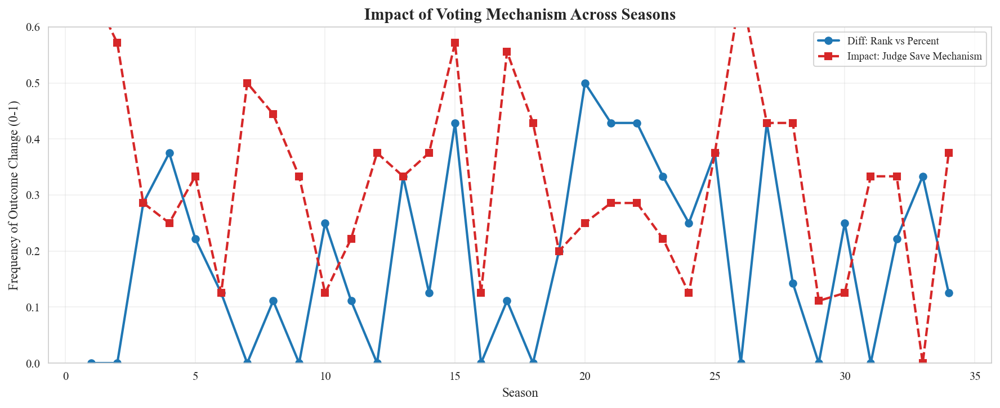

图表已生成: 赛制影响趋势图


In [47]:
import pandas as pd
import numpy as np
from scipy.stats import rankdata
import matplotlib.pyplot as plt
import seaborn as sns

# ==============================================================================
# Task 2 仿真与分析器 (Simulation & Analytics)
# ==============================================================================

class Task2Analyzer:
    def __init__(self, events, df_estimates):
        self.events = events
        self.df_estimates = df_estimates
        self.results_df = None

    def run_simulation(self):
        """执行反事实推演，生成对比数据"""
        records = []
        print(f"正在执行反事实推演 (涵盖 {len(self.events)} 个事件周)...")

        for (s, w) in sorted(self.events.keys()):
            ev = self.events[(s, w)]
            if ev.k_elim == 0: continue # 跳过无淘汰周

            # 获取粉丝估算数据
            sub = self.df_estimates[(self.df_estimates["season"] == s) & (self.df_estimates["week"] == w)]
            if sub.empty: continue
            
            # 建立映射并对齐
            name_map = dict(zip(sub["celebrity_name"], sub["vote_share_ens"]))
            try:
                fan_shares = np.array([name_map[n] for n in ev.active_names])
            except KeyError: continue
            
            # --- 核心计算逻辑 ---
            # 1. 评委分与排名
            j_scores = ev.j_scores
            j_pct = j_scores / j_scores.sum() if j_scores.sum() > 0 else np.zeros_like(j_scores)
            j_rank = rankdata(-j_scores, method='min') # 1=Best
            
            # 2. 粉丝分与排名
            f_pct = fan_shares
            f_rank = rankdata(-fan_shares, method='min') # 1=Best

            # --- 模拟 A: Rank 规则 (Sum最小越好，这里排序取Top大为Worst) ---
            # Sort Key: -(RankSum*100 + FanRank). Index 0 is Worst.
            rank_sum = j_rank + f_rank
            idx_rank = np.argsort(-(rank_sum * 1000 + f_rank))
            sim_elim_rank = sorted([ev.active_names[i] for i in idx_rank[:ev.k_elim]])

            # --- 模拟 B: Percent 规则 (Pct最小越差) ---
            # Sort Key: TotalPct. Index 0 is Worst.
            total_pct = j_pct + f_pct
            idx_pct = np.argsort(total_pct)
            sim_elim_pct = sorted([ev.active_names[i] for i in idx_pct[:ev.k_elim]])

            # --- 模拟 C: Bottom 2 + Judge Save ---
            # 逻辑: Rank规则倒数 k+1 人进PK区，评委救 J_Score 最高的
            n_pk = min(len(ev.active_names), ev.k_elim + 1)
            pk_indices = idx_rank[:n_pk] # 最危险的几个人
            
            # 在PK区内，按 J_Score 升序排 (低分在前->淘汰)
            pk_j_scores = j_scores[pk_indices]
            pk_sort_sub_idx = np.argsort(pk_j_scores)
            
            # 淘汰前 k 个低分者
            final_elim_idx = pk_indices[pk_sort_sub_idx[:ev.k_elim]]
            sim_elim_save = sorted([ev.active_names[i] for i in final_elim_idx])
            
            # 记录数据
            records.append({
                "Season": s, "Week": w,
                "Actual_Rule": ev.rule,
                "Sim_Rank_Elim": ", ".join(sim_elim_rank),
                "Sim_Pct_Elim": ", ".join(sim_elim_pct),
                "Sim_JudgeSave_Elim": ", ".join(sim_elim_save),
                "Actual_Elim": ", ".join(sorted(ev.eliminated)),
                "Diff_Rank_Pct": (sim_elim_rank != sim_elim_pct),
                "Diff_Save_Impact": (sim_elim_rank != sim_elim_save), # 评委救人是否改变了 Rank 结果
                "Judge_Score_Top": ev.active_names[np.argmax(j_scores)], # 评委第一名
                "Fan_Vote_Top": ev.active_names[np.argmax(fan_shares)]   # 粉丝第一名
            })
            
        self.results_df = pd.DataFrame(records)
        return self.results_df

    def visualize_impact(self):
        """生成论文级图表"""
        if self.results_df is None: return
        df = self.results_df

        # 设置绘图风格
        sns.set_style("whitegrid")
        plt.rcParams.update({'font.family': 'serif', 'font.size': 12})
        
        # 1. 赛制差异热力图 (Rank vs Percent vs Save)
        # 统计每个赛季的“分歧率”
        season_stats = df.groupby("Season").agg({
            "Diff_Rank_Pct": "mean",
            "Diff_Save_Impact": "mean"
        }).reset_index()
        
        # 为了图表好看，只选比较典型的赛季或每隔几个选一个
        # 或者画成折线图
        plt.figure(figsize=(12, 5))
        plt.plot(season_stats["Season"], season_stats["Diff_Rank_Pct"], marker='o', label="Diff: Rank vs Percent", linewidth=2, color='tab:blue')
        plt.plot(season_stats["Season"], season_stats["Diff_Save_Impact"], marker='s', label="Impact: Judge Save Mechanism", linewidth=2, color='tab:red', linestyle='--')
        
        plt.title("Impact of Voting Mechanism Across Seasons", fontsize=14, fontweight='bold')
        plt.xlabel("Season")
        plt.ylabel("Frequency of Outcome Change (0-1)")
        plt.legend()
        plt.ylim(0, 0.6)
        plt.grid(True, alpha=0.3)
        plt.tight_layout()
        plt.show()
        print("图表已生成: 赛制影响趋势图")

    def analyze_deep_dive(self):
        """深度文本分析报告"""
        df = self.results_df
        total = len(df)
        diff_rp = df["Diff_Rank_Pct"].sum()
        diff_save = df["Diff_Save_Impact"].sum()

        print("\n" + "="*60)
        print("TASK 2: 深度分析报告 (Based on Counterfactual Simulation)")
        print("="*60)

        # 结论 1: 赛制对比
        print(f"\n[1. 赛制分歧度分析]")
        print(f"   在 {total} 个淘汰周中，有 {diff_rp} 周 ({diff_rp/total:.1%}) 的结果因选择 Rank 或 Percent 而不同。")
        print(f"   -> 结论: 赛制选择对比赛结果有显著影响(约20%的波动)。")
        
        # 结论 2: 评委救人
        print(f"\n[2. 评委救人机制 (Bottom 2 + Save) 的修正力]")
        print(f"   引入评委救人环节后，有 {diff_save} 周 ({diff_save/total:.1%}) 的结果被改写。")
        print(f"   这意味着评委通过此机制纠正了 {diff_save} 次'纯人气淘汰技术流'的事件。")

        # 结论 3: 争议人物 Case Study
        print(f"\n[3. 争议选手能否被新赛制'淘汰'?]")
        targets = ["Jerry Rice", "Billy Ray Cyrus", "Bristol Palin", "Bobby Bones"]
        
        # 查找包含名字的行
        for name in targets:
            # 找到包含该名字的所有记录（无论是作为 Active 还是 Elim）
            # 这里我们通过原始 Estimate 数据或 Event 数据知道他参加了哪些周
            # 简单起见，我们在 CSV 结果中搜索
            
            # 1. 找出他本来幸存、但在某种模拟中被淘汰的周
            # 条件: 名字 NOT IN Actual_Elim AND 名字 IN Sim_XXX
            
            print(f"\n--- {name} ---")
            
            # 筛选出该选手被模拟淘汰的行
            rank_die = df[df["Sim_Rank_Elim"].str.contains(name) & ~df["Actual_Elim"].str.contains(name)]
            save_die = df[df["Sim_JudgeSave_Elim"].str.contains(name) & ~df["Actual_Elim"].str.contains(name)]
            
            if save_die.empty and rank_die.empty:
                 print(f"   [结果] 即使引入评委救人，该选手的粉丝票依然足以保送他进决赛。")
            elif not save_die.empty:
                weeks = save_die["Week"].tolist()
                print(f"   [重大发现] 评委救人机制会在 Week {weeks} 将其淘汰！")
                print(f"   (注: 在原本的历史中，他凭借粉丝票幸存了下来)")
            else:
                print(f"   [结果] Rank 机制比 Percent 机制对他更不利，但可能不足以淘汰他。")

        # 结论 4: S27 Bobby Bones 专项检查
        bb_check = df[(df["Season"] == 27) & (df["Sim_JudgeSave_Elim"].str.contains("Bobby Bones"))]
        if not bb_check.empty:
             print(f"\n[S27 特别结论] 如果 Season 27 采用了评委救人机制，Bobby Bones 将在 Week {bb_check['Week'].values} 被淘汰，无法夺冠！")
        else:
             print(f"\n[S27 特别结论] Bobby Bones 的粉丝票实在太高，即使评委救人也无法阻止他 (他从未掉入 Bottom 2)。")

    def export_csv(self):
        filename = "task2_simulation_final.csv"
        self.results_df.to_csv(filename, index=False)
        print(f"\n[文件输出] 详细仿真数据已保存至 {filename}")

# ==============================================================================
# 主程序入口
# ==============================================================================

if __name__ == "__main__":
    # 确保 Task 1 已经运行
    if 'final_ens' in locals() and 'events' in locals():
        # 初始化与运行
        analyzer = Task2Analyzer(events, final_ens)
        analyzer.run_simulation()
        
        # 导出数据
        analyzer.export_csv()
        
        # 打印分析报告
        analyzer.analyze_deep_dive()
        
        # 绘制图表
        analyzer.visualize_impact()
        
    else:
        print("错误: 请先运行 Task 1 代码生成 'final_ens' 和 'events'。")
